In [388]:
from sklearn.manifold import TSNE
from collections import defaultdict
import json
import pickle
from matplotlib import pyplot as plt
from os import chdir, getcwd, walk
from progiter import ProgIter
import pandas as pd
import numpy as np
import warnings
import umap
import time
import string
import seaborn as sns
from scipy.spatial.distance import jaccard, cosine, dice
import datetime
from imp import reload as r
from mymodule import clustering


In [514]:
r(clustering)

<module 'mymodule.clustering' from '/tf/notebooks/code_for_pub/mymodule/clustering.py'>

In [385]:
files = ['fps_morgan_1024bit.pickle',
 'fps_transformer_64bit_new.pickle',
 'fps_VAE_256bit_new.pickle',
 'fps_topo_1024bit.pickle',
 'fps_infomax_new.pickle',
 'fps_morgan_300bit.pickle',
 'fps_topo_300bit.pickle',
 'fps_gae_64bit_new.pickle',
 'fps_transformer_1024bit_new.pickle',
 'fps_e3fp_1024bit.pickle',
 'fps_VAE_16bit_new.pickle']

In [46]:
holder = {}
for file in files:
    with open(f'/tf/notebooks/code_for_pub/fp_files/{file}', 'rb') as f:
        fp = pickle.load(f)
        holder[file.split('.')[0]]=fp

In [47]:
# but here an issue might be that there is no good distance function to calculate UMAP for neural fingerprints
## maybe euclidean distance is a poor method

#umaps = {}
#for k,v in ProgIter(holder.items(), total=len(holder), show_times=True):
#    temp = v.values
#    for n in [2, 5, 10, 20, 50, 100, 200]: # neighbours 
#        for dist in [0.0, 0.1, 0.18, 0.25, 0.34, 0.5, 0.6, 0.8, 0.99]:
#                if k in ['fps_morgan_1024bit','fps_morgan_300bit','fps_morgan_300bit','fps_morgan_1024bit']:
#                    metric ='jaccard'
#                else:
#                    metric = 'euclidean'

#                fit = umap.UMAP(
#                    n_neighbors=n,
#                    min_dist=dist,
#                    n_components=2,
#                    metric=metric,
#                    random_state=42,
#                )
#                u = fit.fit_transform(temp);
#                name = k+'_'+str(n)+'_'+str(dist)
#                umaps[name] = pd.DataFrame(data=u, index=v.index)
#with open('/tf/notebooks/code_for_pub/umaps.pickle','wb') as f:
#    pickle.dump(umaps, f)


In [48]:
with open('/tf/notebooks/code_for_pub/umaps.pickle','rb') as f:
    umaps = pickle.load(f)

In [49]:
#from celluloid import Camera
#from IPython.display import HTML

#fig = plt.figure(figsize=(12,8))
#camera = Camera(fig)
#for i in [x for x in umaps.keys() if 'transformer' in x]:
#    test = umaps[i].values
#    t = plt.scatter(test[:,0],test[:,1], marker='.',c='grey', linewidths=2)
#    camera.snap()
#animation = camera.animate(blit=False)
#HTML(animation.to_jshtml(fps=5))


### let's get drug mapping (cid <-> MoA)

In [50]:
b = holder['fps_infomax_new'].copy()

drugs_name = '/tf/notebooks/code_for_pub/smiles_files/drugcomb_drugs_export_OCT2020.csv'
drugs = pd.read_csv(drugs_name, names=['dname','id', 'smiles', 'cid'], header=0) # oct2020 version

mapping = defaultdict(list) 
for i in drugs.itertuples(): # map id to cid
    if i.id in b.index:
        mapping[i.id] = i.cid
inverse_mapping = {v:k for k,v in mapping.items()} # cid to id
    

#b['id'] = b.index.to_list()
#b['id'] = b['id'].map(mapping)
#b = b.set_index('id', drop=True)

In [51]:
# From drug repurposing hub
# create a mapping file. CID <-> MoA. 
df1 = pd.read_csv('https://s3.amazonaws.com/data.clue.io/repurposing/downloads/repurposing_samples_20200324.txt', 
                  sep='\t', skiprows=9)
df1 = df1[['pert_iname','pubchem_cid']].drop_duplicates(subset='pubchem_cid').dropna()
df2 = pd.read_csv('https://s3.amazonaws.com/data.clue.io/repurposing/downloads/repurposing_drugs_20200324.txt', 
                  sep='\t', skiprows=9)
df2 = df2[['pert_iname','moa']].drop_duplicates(subset='pert_iname').dropna()

# merging by compound name and dropna
df_merged = pd.merge(df1, df2, on='pert_iname', how='left')
df_merged.loc[:,'pubchem_cid'] = df_merged.loc[:,'pubchem_cid'].astype(int)
df_merged = df_merged.dropna()

moa_dict = df_merged[['pubchem_cid','moa']].set_index('pubchem_cid').to_dict()['moa'] # cid: drug_mechanism

In [52]:
# ATC from PubChem
# https://pubchem.ncbi.nlm.nih.gov/#input_type=list&query=v_ga-G8hCp09s4KqANLLuwttuQ2F9kHFO-BaiSDxSIgg6HQ&collection=compound&alias=PubChem%3A%20PubChem%20Compound%20TOC%3A%20MeSH%20Pharmacological%20Classification&sort=cid&page=1
with open('/tf/notebooks/code_for_pub/input_files/download.json', 'rb') as f:
    atc1 = json.load(f)
with open('/tf/notebooks/code_for_pub/input_files/2.json', 'rb') as f:
    atc2 = json.load(f)    
with open('/tf/notebooks/code_for_pub/input_files/3.json', 'rb') as f:
    atc3 = json.load(f)    
with open('/tf/notebooks/code_for_pub/input_files/4.json', 'rb') as f:
    atc4 = json.load(f)    
with open('/tf/notebooks/code_for_pub/input_files/5.json', 'rb') as f:
    atc5 = json.load(f)    
    
atc_codes = defaultdict(list) # cid vs ATC
counter= 0
for dictionary in [atc1,atc2,atc3,atc4,atc5]:
    for i in dictionary['Annotations']['Annotation']:
        try:
            atc_codes[i['LinkedRecords']['CID'][0]].append([i['Data'][0]['Value']['StringWithMarkup'][2]['String'],
                                                           i['Data'][0]['Value']['StringWithMarkup'][3]['String']])
            counter += 1
        except:
            pass

In [378]:
# drugcomb ID : MoA
empty = 0
all_moa = defaultdict(list)
for x in holder['fps_VAE_16bit_new'].index.drop_duplicates():
    empty += 1
    #get correspondindg CID
    cid = mapping[x]
    moa1 = moa_dict.get(cid, None)
    moa2 = atc_codes.get(cid, None)
    temp = []
    if moa1 is not None:
        temp.append(moa1)
    if moa2 is not None:
        temp.extend(moa2[0])
    if len(temp)>0:
        all_moa[x] = temp
print(empty-len(all_moa))

1911


In [55]:
kinases = []

for k,v in all_moa.items():
    if any([True for x in v if 'kinase' in x]):
        kinases.append(k)
    if any([True for x in v if 'AKT' in x]):
        kinases.append(k)
    if any([True for x in v if 'MEK' in x]):
        kinases.append(k)
    if any([True for x in v if 'PI3K' in x]):
        kinases.append(k)
    if any([True for x in v if 'CDK' in x]):
        kinases.append(k)
    if any([True for x in v if 'CHK' in x]):
        kinases.append(k)
    if any([True for x in v if 'FLT3' in x]):
        kinases.append(k)
    if any([True for x in v if 'EGFR' in x]):
        kinases.append(k)
    if any([True for x in v if 'CLK' in x]):
        kinases.append(k)
    if any([True for x in v if 'CDC' in x]):
        kinases.append(k)
    if any([True for x in v if 'BCL' in x]):
        kinases.append(k)
    if any([True for x in v if 'RAF' in x]):
        kinases.append(k)
    if any([True for x in v if 'STAT' in x]):
        kinases.append(k)
    if any([True for x in v if 'JAK' in x]):
        kinases.append(k)
    if any([True for x in v if 'MET' in x]):
        kinases.append(k)
    if any([True for x in v if 'SYK' in x]):
        kinases.append(k)
    if any([True for x in v if 'TGF' in x]):
        kinases.append(k)
    if any([True for x in v if 'MAPK' in x]):
        kinases.append(k)
    if any([True for x in v if 'c-myc' in x.lower()]):
        kinases.append(k)
    if any([True for x in v if 'c-met' in x.lower()]):
        kinases.append(k)
    if any([True for x in v if 'erk' in x.lower()]):
        kinases.append(k)
    if any([True for x in v if 'plk' in x.lower()]):
        kinases.append(k)
    if any([True for x in v if 'ikk' in x.lower()]):
        kinases.append(k)
    if any([True for x in v if 'JNK' in x]):
        kinases.append(k)
    if any([True for x in v if 'SRC' in x]):
        kinases.append(k)
    if any([True for x in v if 'PKC' in x]):
        kinases.append(k)
    if any([True for x in v if 'mTOR' in x]):
        kinases.append(k)
    if any([True for x in v if 'RIPK' in x]):
        kinases.append(k)
    if any([True for x in v if 'FGFR' in x]):
        kinases.append(k)
    if any([True for x in v if 'AMPK' in x]):
        kinases.append(k)
    if any([True for x in v if 'dyrk' in x.lower()]):
        kinases.append(k)
    if any([True for x in v if 'gtpase' in x.lower()]):
        kinases.append(k)
    if any([True for x in v if 'WNT' in x]):
        kinases.append(k)
    if any([True for x in v if 'IGF' in x]):
        kinases.append(k)
kinases = list(set(kinases))

In [56]:
alkaloids = []

for k,v in all_moa.items():
    if k in kinases:
        pass
    else:
        if any([True for x in v if 'alkaloid' in x]):
            alkaloids.append(k)
    

In [57]:
antimetabolites = []

for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids):
        pass
    else:
        if any([True for x in v if 'antimetabolites' in x.lower()]):
            antimetabolites.append(k)
    

In [58]:
DNA = []
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites):
        pass
    else: 
        if any([True for x in v if 'dna' in x.lower()]):
            DNA.append(k)
        if any([True for x in v if 'hdac' in x.lower()]):
            DNA.append(k)
        if any([True for x in v if 'ribonucleot' in x.lower()]):
            DNA.append(k)
        if any([True for x in v if 'topoiso' in x.lower()]):
            DNA.append(k)
        if any([True for x in v if 'rna' in x.lower()]):
            DNA.append(k)
        if any([True for x in v if 'histone' in x.lower()]):
            DNA.append(k)
DNA = list(set(DNA))

In [59]:
anti_drugs = []
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites) | (k in DNA):
        pass
    else: 
        if any([True for x in v if 'antiviral' in x.lower()]):
            anti_drugs.append(k)
        if any([True for x in v if 'antifungal' in x.lower()]):
            anti_drugs.append(k)
        if any([True for x in v if 'antifungal' in x.lower()]):
            anti_drugs.append(k)
        if any([True for x in v if 'antibiotic' in x.lower()]):
            anti_drugs.append(k)
        if any([True for x in v if 'malar' in x.lower()]):
            anti_drugs.append(k)
        if any([True for x in v if 'bacterial' in x.lower()]):
            anti_drugs.append(k)
        if any([True for x in v if 'nematod' in x.lower()]):
            anti_drugs.append(k)
        if any([True for x in v if 'antiseptic' in x.lower()]):
            anti_drugs.append(k)
        if any([True for x in v if 'antiinfective' in x.lower()]):
            anti_drugs.append(k)
        if any([True for x in v if 'macrolide' in x.lower()]):
            anti_drugs.append(k)
        if any([True for x in v if 'antiproto' in x.lower()]):
            anti_drugs.append(k)
        if any([True for x in v if 'antimyco' in x.lower()]):
            anti_drugs.append(k)
        if any([True for x in v if 'protozo' in x.lower()]):
            anti_drugs.append(k)
        if any([True for x in v if 'tuberculosis' in x.lower()]):
            anti_drugs.append(k)
        if any([True for x in v if 'trypano' in x.lower()]):
            anti_drugs.append(k)
        if any([True for x in v if 'sulfonam' in x.lower()]):
            anti_drugs.append(k)
        if any([True for x in v if 'atpase' in x.lower()]):
            anti_drugs.append(k)
        if any([True for x in v if 'hiv' in x.lower()]):
            anti_drugs.append(k)
        if any([True for x in v if 'atp' in x.lower()]):
            anti_drugs.append(k)
        if any([True for x in v if 'lepra' in x.lower()]):
            anti_drugs.append(k)
        
anti_drugs = list(set(anti_drugs))

In [60]:
hormones = [] # hormones and neurotrasnmitters
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites) | (k in DNA)\
    | (k in anti_drugs):
        pass
    else: 
        if any([True for x in v if 'hormon' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'hormon' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'serotonin' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'dopamine' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'adrener' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'monoamine' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'histamine' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'opioid' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'cortico' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'beta blocking' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'progesterone' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'choline' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'benzo' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'estrogen' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'glutamate' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'angiotensin' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'adenosine' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'gaba' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'cannabi' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'faah' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'stimulant' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'melatonin' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'antidepress' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'nervous' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'androgen' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'steroid' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'epinephrine' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'antipsycho' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'centrally' in x.lower()]):
            hormones.append(k)
        if any([True for x in v if 'anxiolyt' in x.lower()]):
            hormones.append(k)
hormones = list(set(hormones))        

In [61]:
antiinflam = []
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites) | (k in DNA) | (k in anti_drugs)\
    | (k in hormones):
        pass
    else: 
        if any([True for x in v if 'antiinflam' in x.lower()]):
            antiinflam.append(k)
        if any([True for x in v if 'cyclooxygenase' in x.lower()]):
            antiinflam.append(k)
antiinflam = list(set(antiinflam))            

In [62]:
lipids = []
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites) | (k in DNA) | (k in anti_drugs)\
    | (k in hormones) | (k in antiinflam):
        pass
    else: 
        if any([True for x in v if 'ACAT' in x]):
            lipids.append(k)
        if any([True for x in v if 'lipid' in x.lower()]):
            lipids.append(k)
        if any([True for x in v if 'cholesterol' in x.lower()]):
            lipids.append(k)
lipids = list(set(lipids))

In [63]:
blood = []
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites) | (k in DNA) | (k in anti_drugs)\
    | (k in hormones) | (k in antiinflam) | (k in lipids):
        pass
    else: 
        if any([True for x in v if 'blood' in x]):
            blood.append(k)
        if any([True for x in v if 'glucose' in x.lower()]):
            blood.append(k)
blood = list(set(blood))
      

In [64]:
channel = [] # Na/K/Ca/cl channel blockers
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites)| (k in DNA) | (k in anti_drugs)\
    | (k in hormones) | (k in antiinflam) | (k in lipids) | (k in blood):
        pass
    else: 
        if any([True for x in v if 'sodium' in x.lower()]):
            channel.append(k)
        if any([True for x in v if 'potassium' in x.lower()]):
            channel.append(k)
        if any([True for x in v if 'calcium' in x.lower()]):
            channel.append(k)
        if any([True for x in v if 'chloride' in x.lower()]):
            channel.append(k)
channel = list(set(channel))            

In [65]:
p450 = [] # 
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites) | (k in DNA) | (k in anti_drugs)\
    | (k in hormones) | (k in antiinflam) | (k in lipids) | (k in blood)| (k in channel):
        pass
    else: 
        if any([True for x in v if 'p450' in x.lower()]):
            p450.append(k)
       

In [66]:
alkylating = []
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites) | (k in DNA) | (k in anti_drugs)\
    | (k in hormones) | (k in antiinflam) | (k in lipids) | (k in blood)| (k in channel) | (k in p450):
        pass
    else: 
        if any([True for x in v if 'alkylating' in x.lower()]):
            alkylating.append(k)
       

In [67]:
antiepileptics=[]
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites)|  (k in DNA) | (k in anti_drugs)\
    | (k in hormones) | (k in antiinflam) | (k in lipids) | (k in blood)| (k in channel) | (k in p450) \
    | (k in alkylating):
        pass
    else: 
        if any([True for x in v if 'epileptic' in x.lower()]):
            antiepileptics.append(k)

In [68]:
antagonist=[]
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites) | (k in DNA) | (k in anti_drugs)\
    | (k in hormones) | (k in antiinflam) | (k in lipids) | (k in blood)| (k in channel) | (k in p450) \
    | (k in alkylating) | (k in antiepileptics):
        pass
    else: 
        if any([True for x in v if 'antagonist' in x.lower()]):
            antagonist.append(k)

In [69]:
inhibitor=[]
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites) | (k in DNA) | (k in anti_drugs)\
    | (k in hormones) | (k in antiinflam) | (k in lipids) | (k in blood)| (k in channel) | (k in p450) \
    | (k in alkylating) | (k in antiepileptics) | (k in antagonist):
        pass
    else: 
        if any([True for x in v if 'inhibitor' in x.lower()]):
            inhibitor.append(k)
        if any([True for x in v if 'parp' in x.lower()]):
            inhibitor.append(k)

In [70]:
immunosuppressant=[]
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites)| (k in DNA) | (k in anti_drugs)\
    | (k in hormones) | (k in antiinflam) | (k in lipids) | (k in blood)| (k in channel) | (k in p450) \
    | (k in alkylating) | (k in antiepileptics) | (k in antagonist) | (k in inhibitor):
        pass
    else: 
        if any([True for x in v if 'immunosuppressant' in x.lower()]):
            immunosuppressant.append(k)

In [71]:
vitamin=[]
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites)|  (k in DNA) | (k in anti_drugs)\
    | (k in hormones) | (k in antiinflam) | (k in lipids) | (k in blood)| (k in channel) | (k in p450) \
    | (k in alkylating) | (k in antiepileptics) | (k in antagonist) | (k in inhibitor) | (k in immunosuppressant):
        pass
    else: 
        if any([True for x in v if 'vitamin' in x.lower()]):
            vitamin.append(k)
        if any([True for x in v if 'niacin' in x.lower()]):
            vitamin.append(k)
        if any([True for x in v if 'retinoid' in x.lower()]):
            vitamin.append(k)

In [72]:
agonist=[]
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites) | (k in DNA) | (k in anti_drugs)\
    | (k in hormones) | (k in antiinflam) | (k in lipids) | (k in blood)| (k in channel) | (k in p450) \
    | (k in alkylating) | (k in antiepileptics) | (k in antagonist) | (k in inhibitor) | (k in immunosuppressant) \
    | (k in vitamin):
        pass
    else: 
        if any([True for x in v if 'agonist' in x.lower()]):
            agonist.append(k)
        if any([True for x in v if 'activator' in x.lower()]):
            agonist.append(k)
       

In [73]:
diuretics=[]
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites) | (k in DNA) | (k in anti_drugs)\
    | (k in hormones) | (k in antiinflam) | (k in lipids) | (k in blood)| (k in channel) | (k in p450) \
    | (k in alkylating) | (k in antiepileptics) | (k in antagonist) | (k in inhibitor) | (k in immunosuppressant) \
    | (k in vitamin) | (k in agonist):
        pass
    else: 
        if any([True for x in v if 'diuretics' in x.lower()]):
            diuretics.append(k)
       

In [74]:
heart=[]
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites) | (k in DNA) | (k in anti_drugs)\
    | (k in hormones) | (k in antiinflam) | (k in lipids) | (k in blood)| (k in channel) | (k in p450) \
    | (k in alkylating) | (k in antiepileptics) | (k in antagonist) | (k in inhibitor) | (k in immunosuppressant) \
    | (k in vitamin) | (k in agonist) | (k in diuretics):
        pass
    else: 
        if any([True for x in v if 'antiarrhy' in x.lower()]):
            heart.append(k)
        if any([True for x in v if 'cardiac' in x.lower()]):
            heart.append(k)
       

In [75]:
antioxidant=[]
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites) | (k in DNA) | (k in anti_drugs)\
    | (k in hormones) | (k in antiinflam) | (k in lipids) | (k in blood)| (k in channel) | (k in p450) \
    | (k in alkylating) | (k in antiepileptics) | (k in antagonist) | (k in inhibitor) | (k in immunosuppressant) \
    | (k in vitamin) | (k in agonist) | (k in diuretics) | (k in heart):
        pass
    else: 
        if any([True for x in v if 'antioxidant' in x.lower()]):
            antioxidant.append(k)
      
       

In [76]:
lung=[]
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites)| (k in DNA) | (k in anti_drugs)\
    | (k in hormones) | (k in antiinflam) | (k in lipids) | (k in blood)| (k in channel) | (k in p450) \
    | (k in alkylating) | (k in antiepileptics) | (k in antagonist) | (k in inhibitor) | (k in immunosuppressant) \
    | (k in vitamin) | (k in agonist) | (k in diuretics) | (k in heart) | (k in antioxidant):
        pass
    else: 
        if any([True for x in v if 'cough' in x.lower()]):
            lung.append(k)
        if any([True for x in v if 'airway' in x.lower()]):
            lung.append(k)
      
       

In [77]:
misc =[]
for k,v in all_moa.items():
    if (k in kinases) | (k in alkaloids) | (k in antimetabolites) | (k in DNA) |(k in anti_drugs) \
    | (k in hormones) |( k in antiinflam) |( k in lipids) | (k in blood) | (k in channel) | (k in p450)\
    | (k in alkylating) | (k in antiepileptics) | (k in antagonist) | (k in inhibitor) | (k in immunosuppressant)\
    | (k in vitamin) | (k in agonist) | (k in diuretics) | (k in heart) | (k in antioxidant) | (k in lung):
        pass
    #elif any([True for x in v if 'rheu' in x]):
    #    print(v)
    else:
        misc.append(k)


In [112]:
labels = {} 
for k,name in zip([kinases, alkaloids, antimetabolites, DNA, anti_drugs, hormones, antiinflam, lipids, blood\
          ,channel, p450, alkylating, antiepileptics, antagonist, inhibitor, immunosuppressant, vitamin\
          ,agonist, diuretics, heart, antioxidant, lung, misc],
             ['Kinase-targeting drugs', 'Alkaloids', 'Antimetabolites', 'Drugs targeting Nucleic Acids', 
              'Antiinfectives', 'Hormones', 'Antiinflamatory','Cholesterol medications', 'Antidiabetic drugs', 
              'Ion channel blockers', 'P450 modulators', 'Alkylating agents', 'Antiepileptics', 
              'Antagonists', 'Inhibitors', 'Immunosuppressants', 'Vitamers and their derivatives', 
              'Agonists', 'Diuretics', 'Antiarrhythmic drugs', 'Antioxidants', 'Bronchodialators', 'Miscellaneous']
            ):
        
        for i in k:
            labels[i]=name

In [383]:
len(['Kinase-targeting drugs', 'Alkaloids', 'Antimetabolites', 'Drugs targeting Nucleic Acids', 
              'Antiinfectives', 'Hormones', 'Antiinflamatory','Cholesterol medications', 'Antidiabetic drugs', 
              'Ion channel blockers', 'P450 modulators', 'Alkylating agents', 'Antiepileptics', 
              'Antagonists', 'Inhibitors', 'Immunosuppressants', 'Vitamers and their derivatives', 
              'Agonists', 'Diuretics', 'Antiarrhythmic drugs', 'Antioxidants', 'Bronchodialators', 'Miscellaneous'])

23

### clustering

Kinase-targeting drugs
Alkaloids
Antimetabolites
Drugs targeting Nucleic Acids
Antiinfectives
Hormones
Antiinflamatory
Antidiabetic drugs
Ion channel blockers
P450 modulators
Alkylating agents
Antiepileptics
Antagonists
Inhibitors
Immunosuppressants
Vitamers and their derivatives
Agonists
Diuretics
Antiarrhythmic drugs
Antioxidants


/tf/notebooks/code_for_pub/mymodule/clustering.py:215: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  distances = dict()


Bronchodialators
Miscellaneous


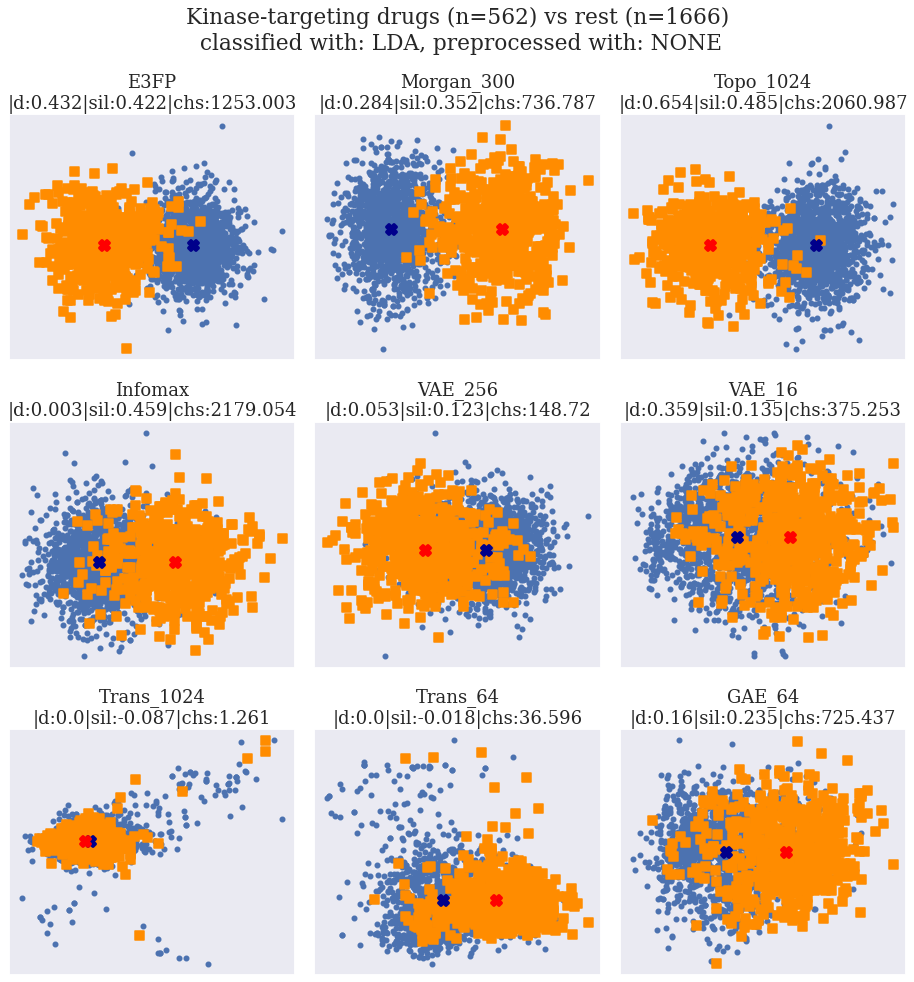

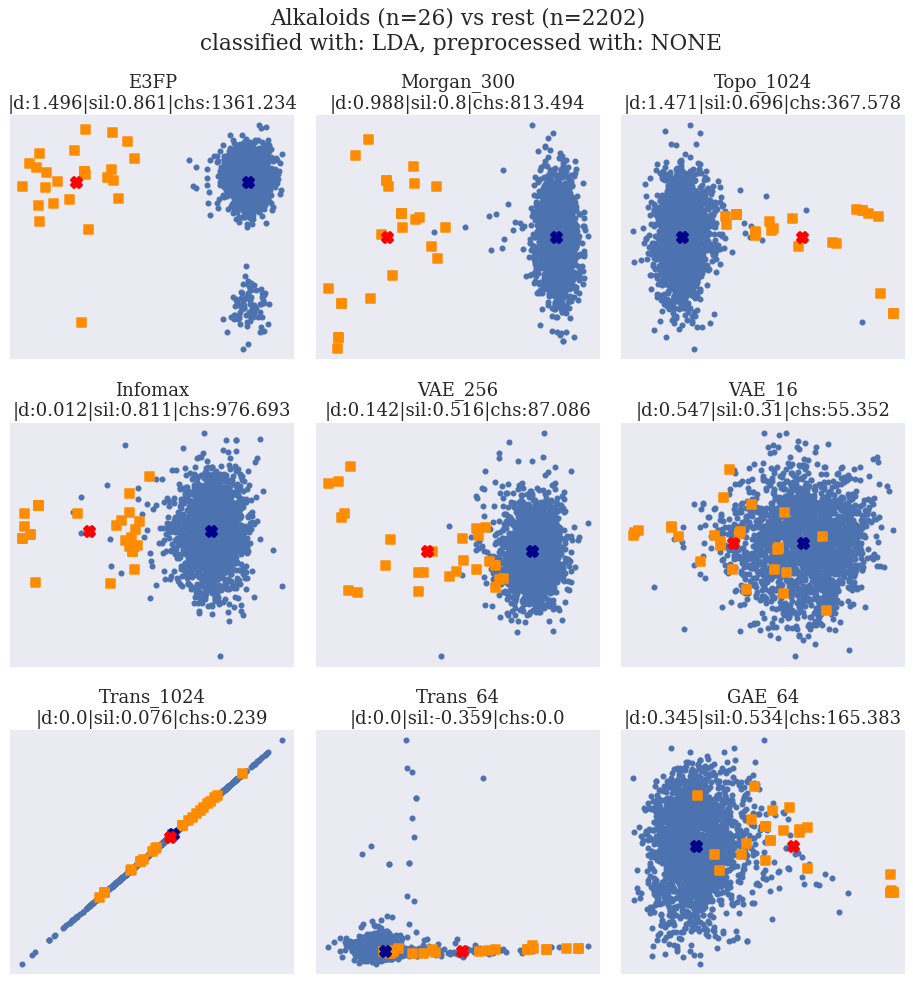

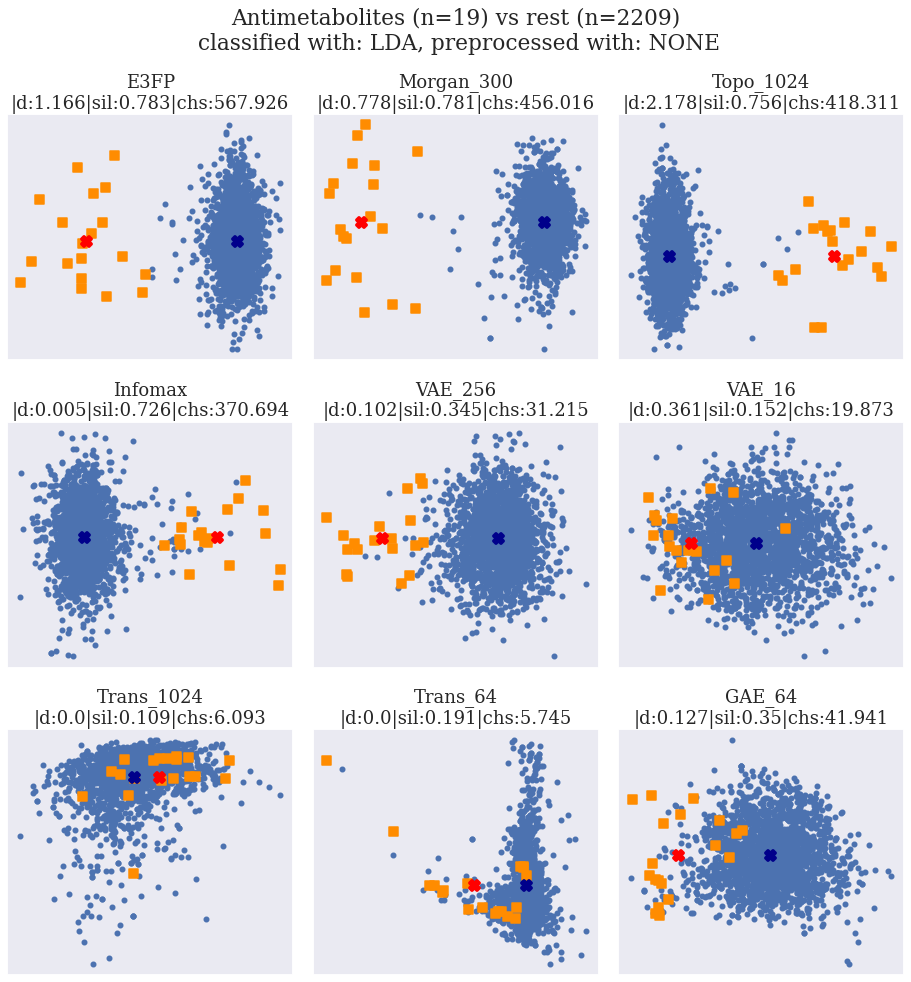

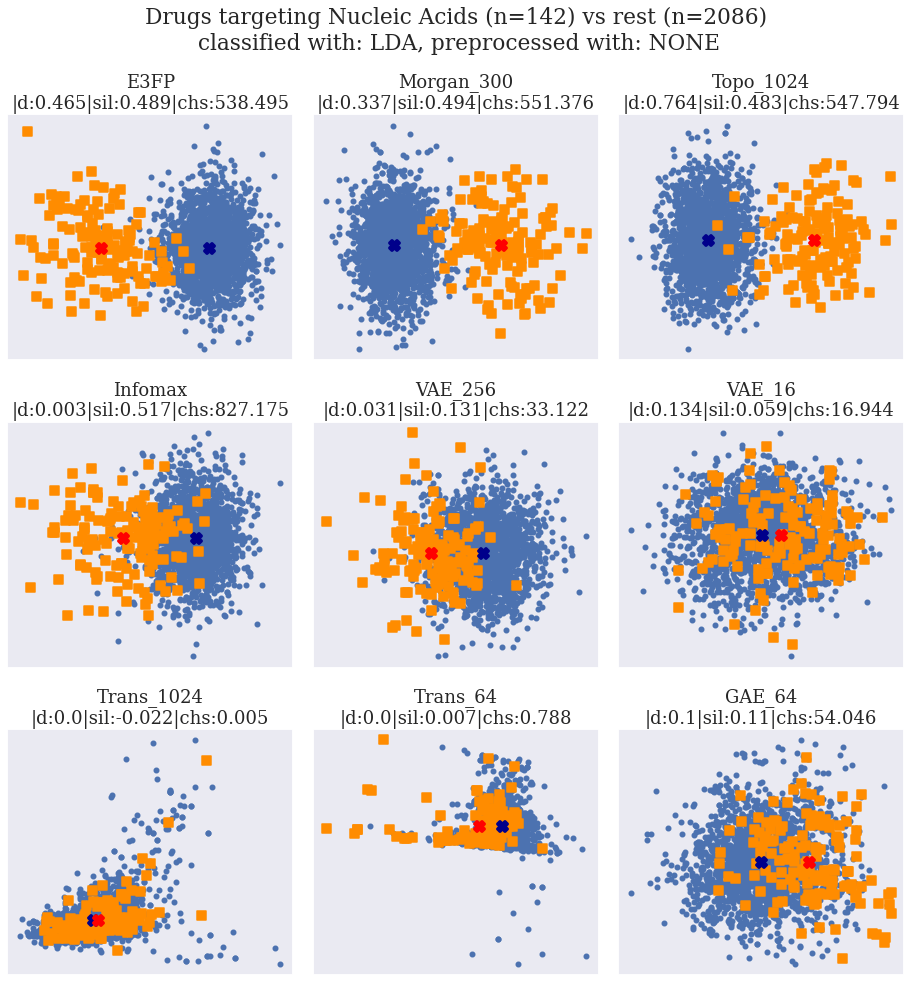

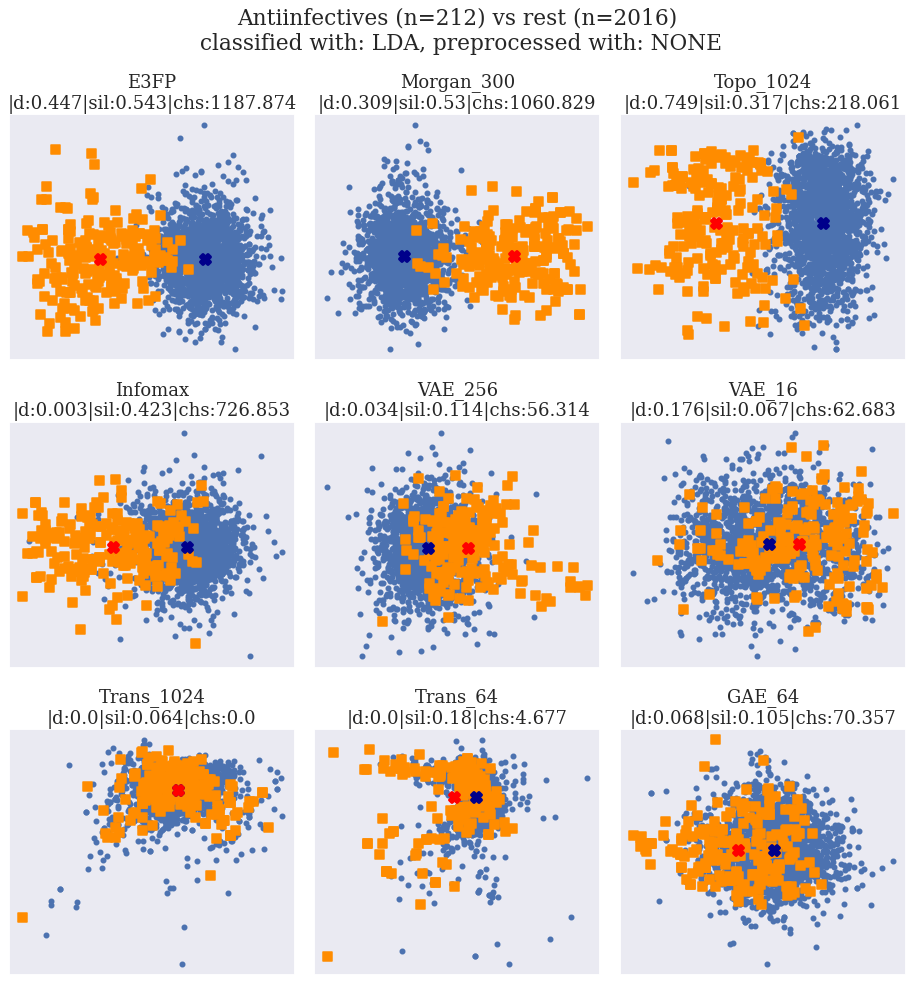

...

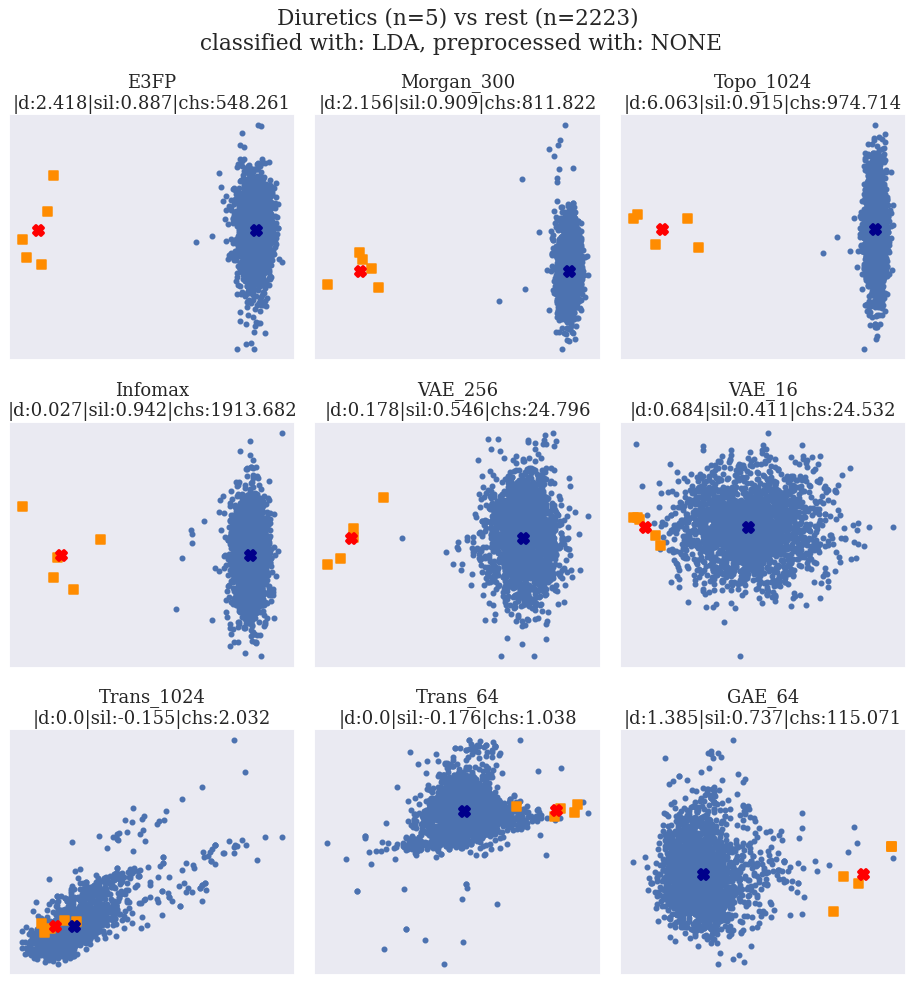

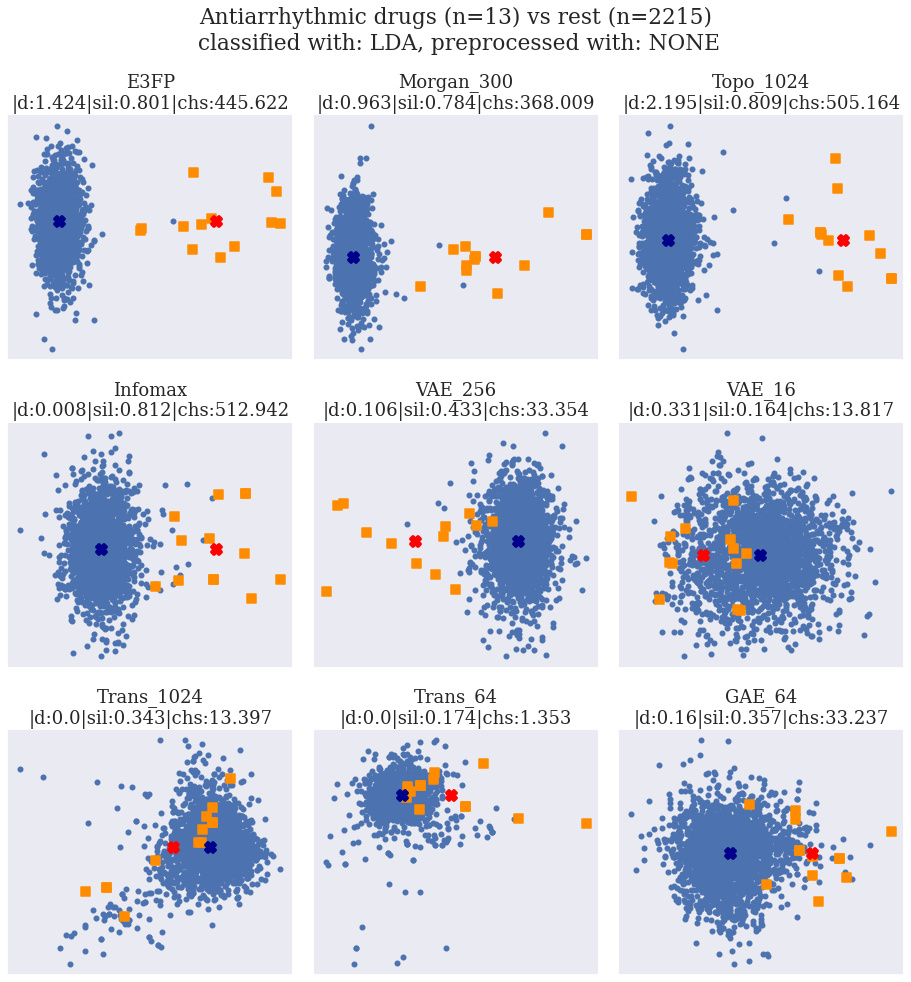

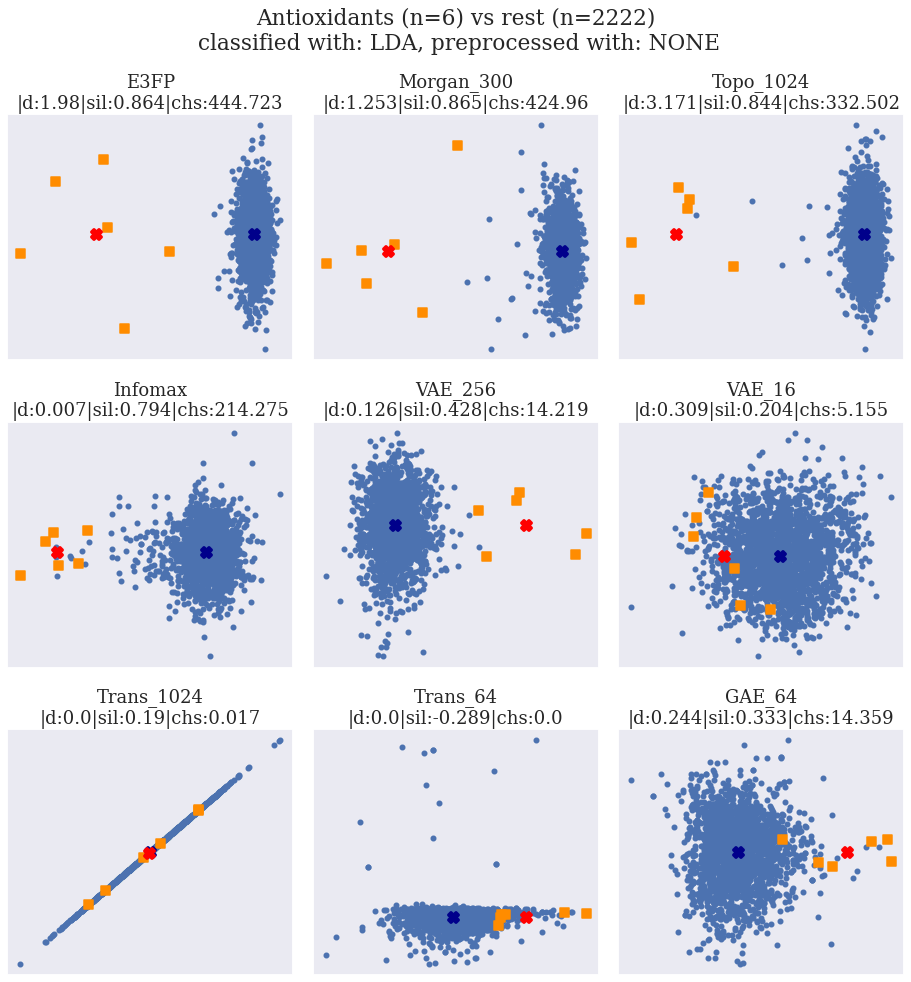

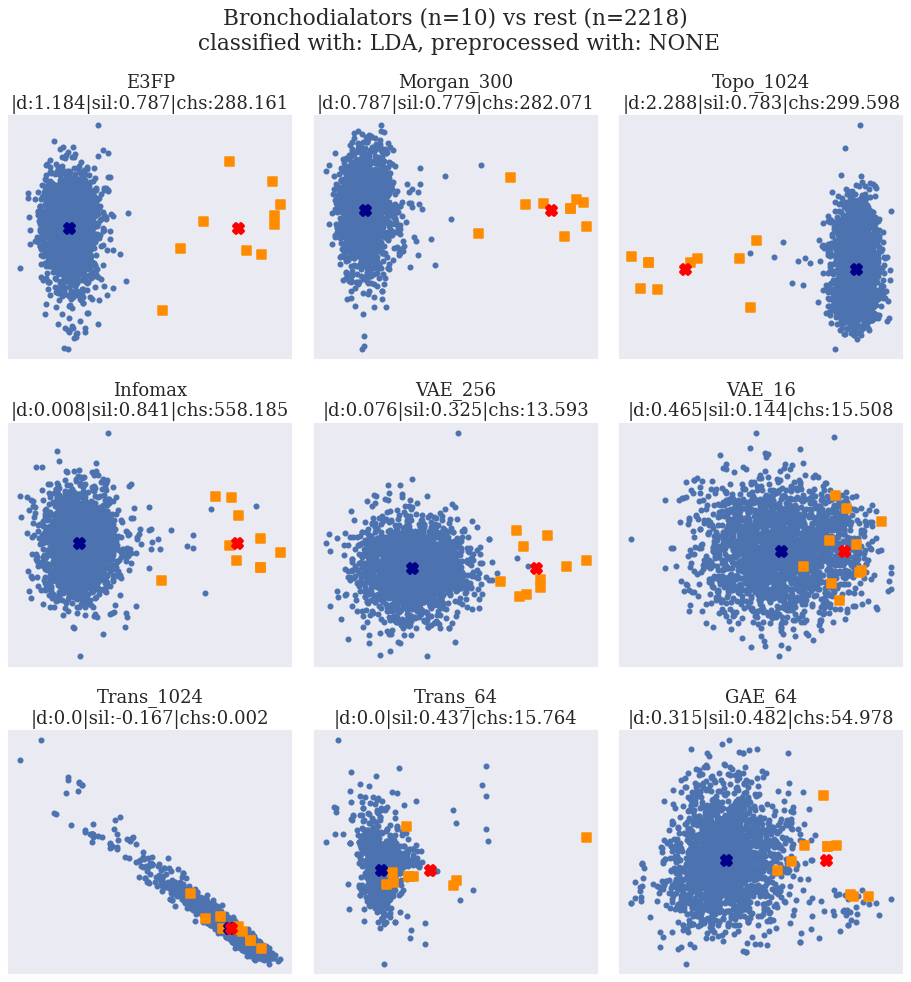

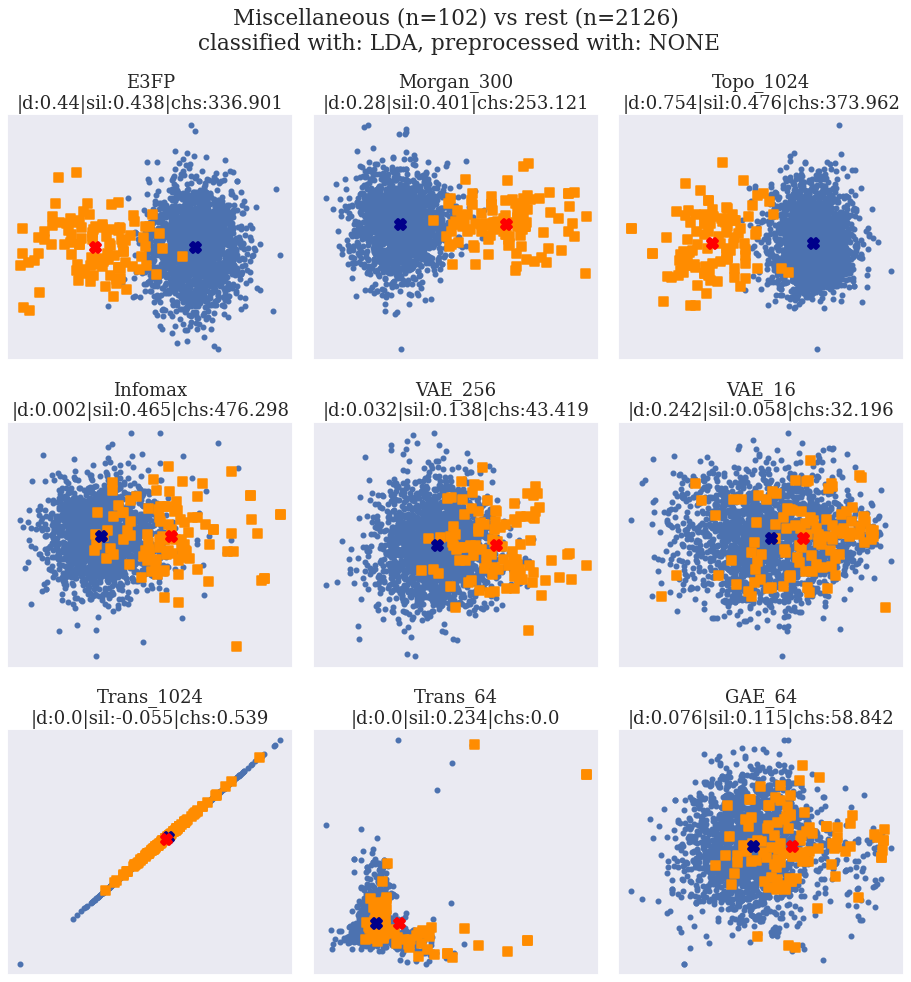

In [515]:
#LDA #  #'Cholesterol medications',
distances = dict()
silhouettes = dict()
chs = dict()
for i in ['Kinase-targeting drugs', 'Alkaloids', 'Antimetabolites', 'Drugs targeting Nucleic Acids', 
              'Antiinfectives', 'Hormones', 'Antiinflamatory', 'Antidiabetic drugs', 
              'Ion channel blockers', 'P450 modulators', 'Alkylating agents', 'Antiepileptics', 
              'Antagonists', 'Inhibitors', 'Immunosuppressants', 'Vitamers and their derivatives', 
              'Agonists', 'Diuretics', 'Antiarrhythmic drugs', 'Antioxidants', 'Bronchodialators', 'Miscellaneous']:
    values, ds, sils, chs_vals = clustering.plot_projections(
        holder=holder, 
        labels=labels, 
        class_name=i, 
        preprocess_lda='NONE',
        only_pca=False,
        binarize_class=True,
        standardize=False, 
        return_distances=True)
    distances[i] = ds
    silhouettes[i] = sils
    chs[i] = chs_vals
    print(i)
                                      

In [516]:
from collections import defaultdict 

s = defaultdict(int)
for key in distances.keys():
    temp = distances[key]
    for k,v in temp.items():
        
        k = k.split(' ')[-1]
        s[k] += v
        
s1 = defaultdict(int)
for key in silhouettes.keys():
    temp = silhouettes[key]
    for k,v in temp.items():
        
        k = k.split(' ')[-1]
        s1[k] += v
        
s2 = defaultdict(int)
for key in chs.keys():
    temp = chs[key]
    for k,v in temp.items():
        
        k = k.split(' ')[-1]
        s2[k] += v
        
s = pd.DataFrame(data=s.values(), index=s.keys(), columns=['overall_separation'])\
.sort_values(by='overall_separation', axis=0, ascending=False)

s1 = pd.DataFrame(data=s1.values(), index=s1.keys(), columns=['overall_silhouette'])\
.sort_values(by='overall_silhouette', axis=0, ascending=False)

s2 = pd.DataFrame(data=s2.values(), index=s2.keys(), columns=['overall_chs'])\
.sort_values(by='overall_chs', axis=0, ascending=False)

s_none_scaler = s[['overall_separation']]\
.merge(s1[['overall_silhouette']], left_index=True, right_index=True)\
.merge(s2[['overall_chs']], left_index=True, right_index=True)\
.sort_values(by='overall_chs', ascending=False)

Kinase-targeting drugs
Alkaloids
Antimetabolites
Drugs targeting Nucleic Acids
Antiinfectives
Hormones
Antiinflamatory
Antidiabetic drugs
Ion channel blockers
P450 modulators
Alkylating agents
Antiepileptics
Antagonists
Inhibitors
Immunosuppressants
Vitamers and their derivatives
Agonists
Diuretics
Antiarrhythmic drugs
Antioxidants


/tf/notebooks/code_for_pub/mymodule/clustering.py:215: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  distances = dict()


Bronchodialators
Miscellaneous


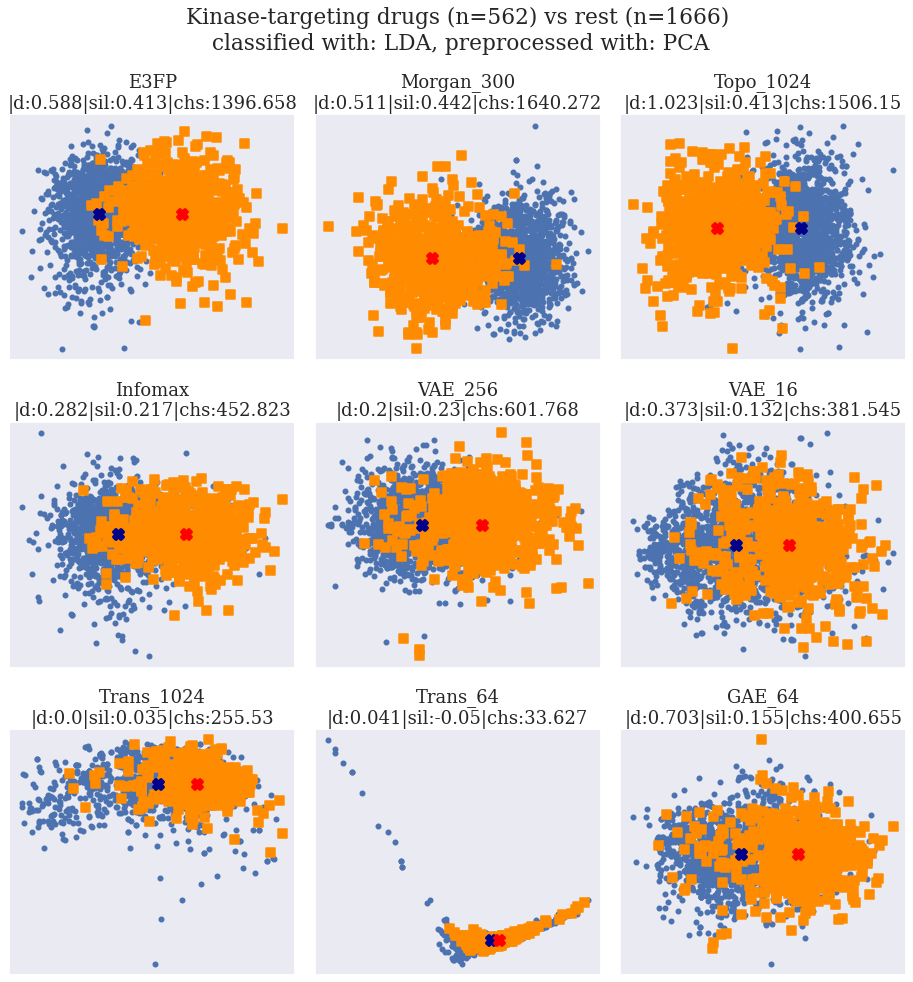

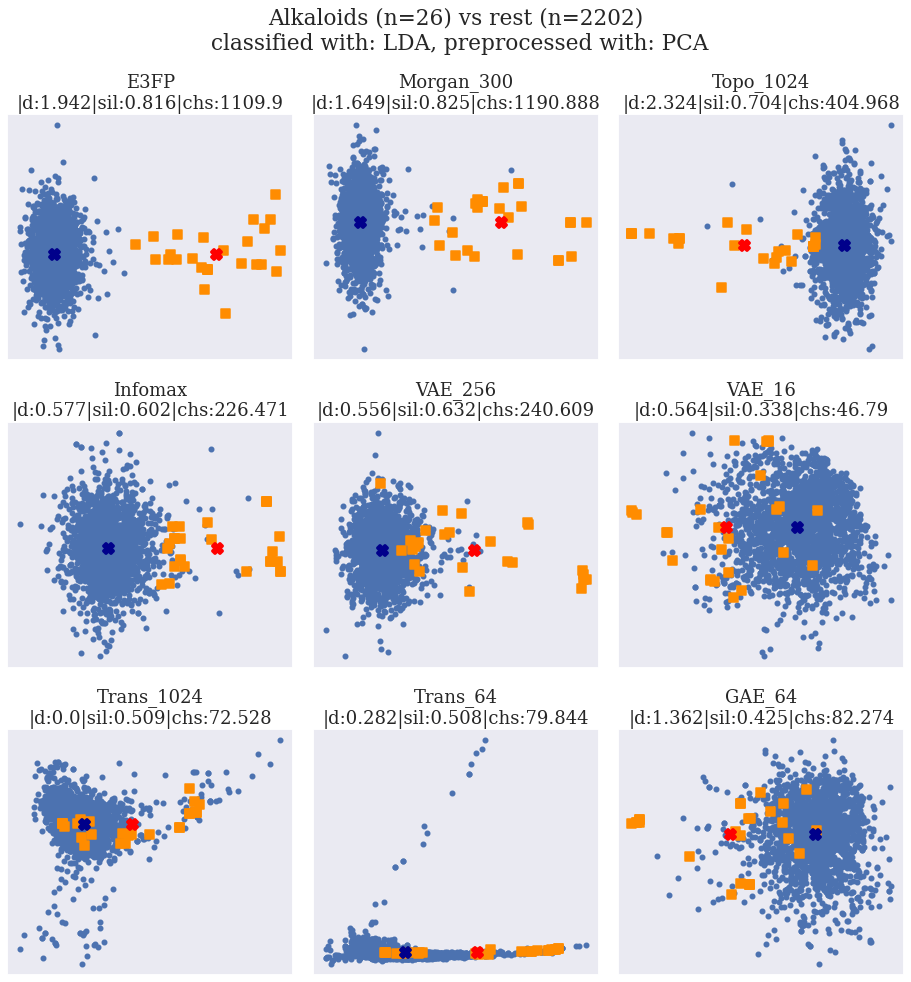

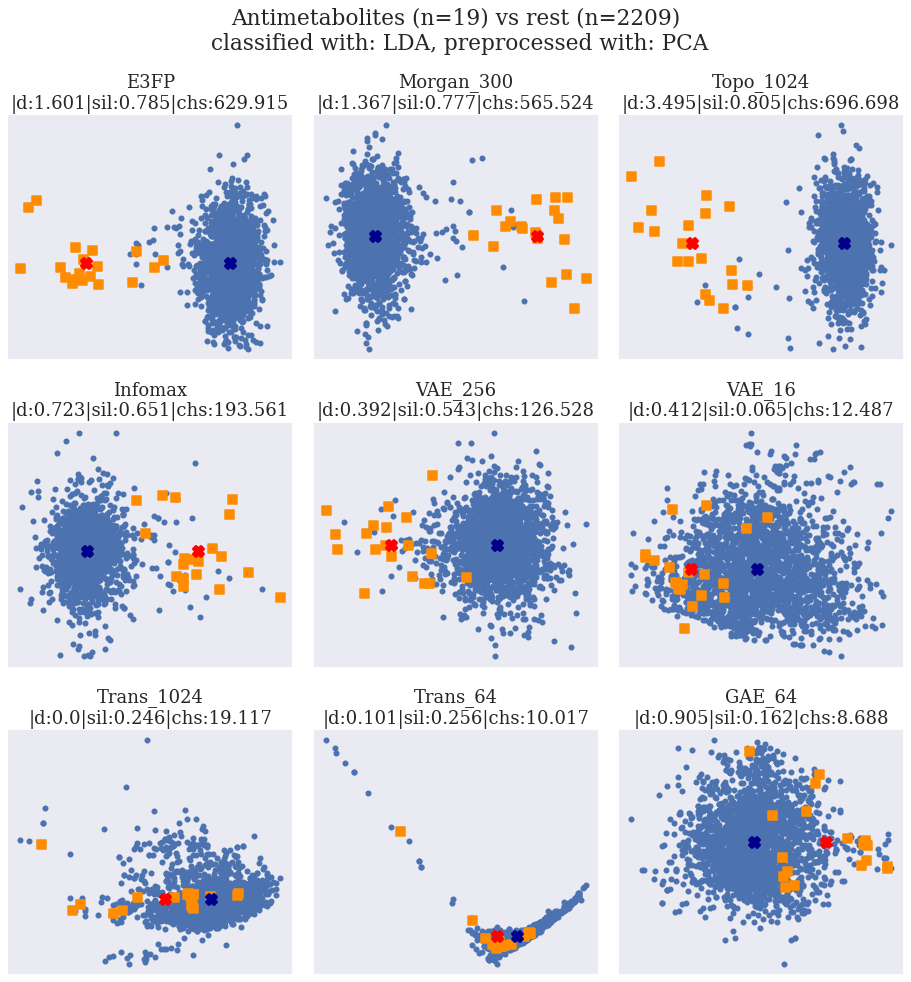

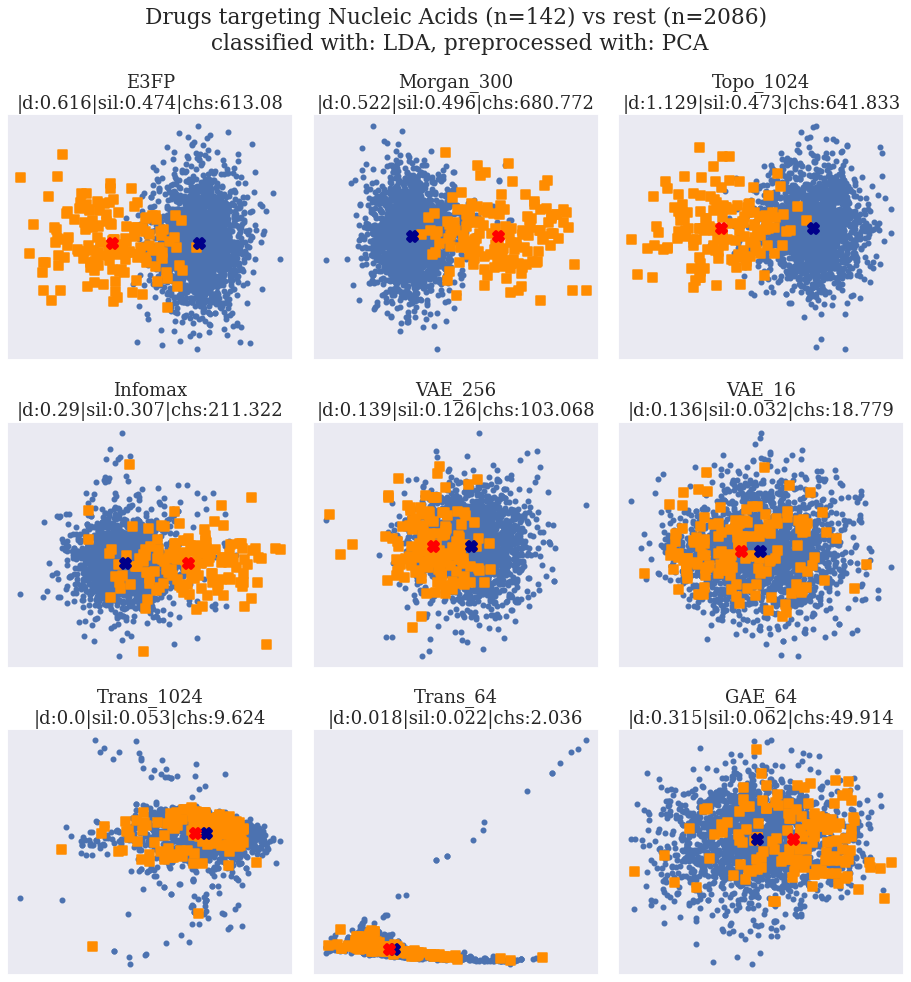

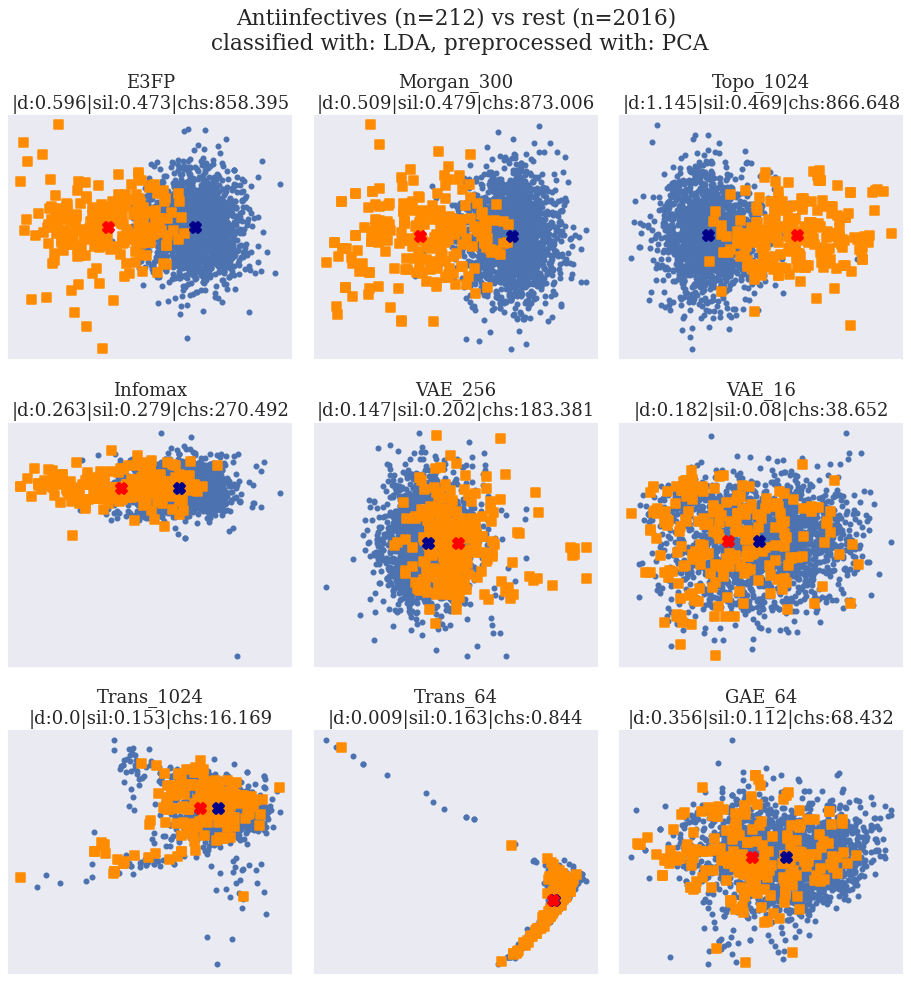

...

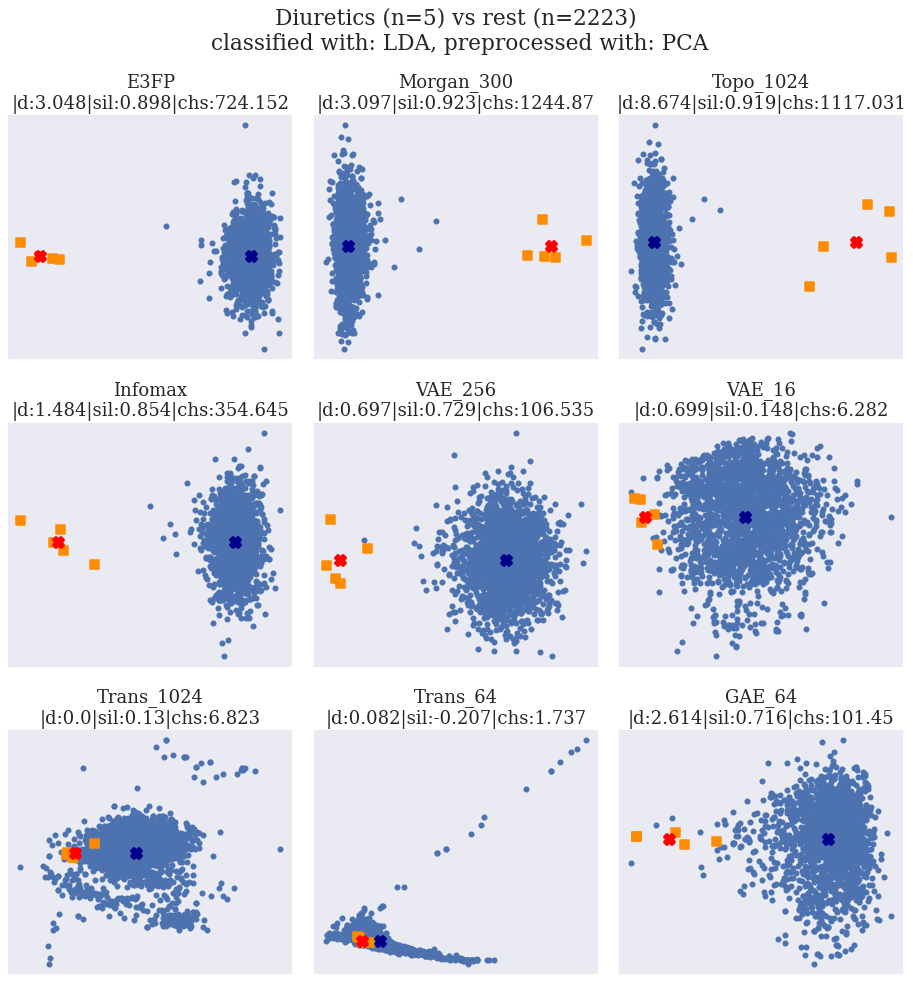

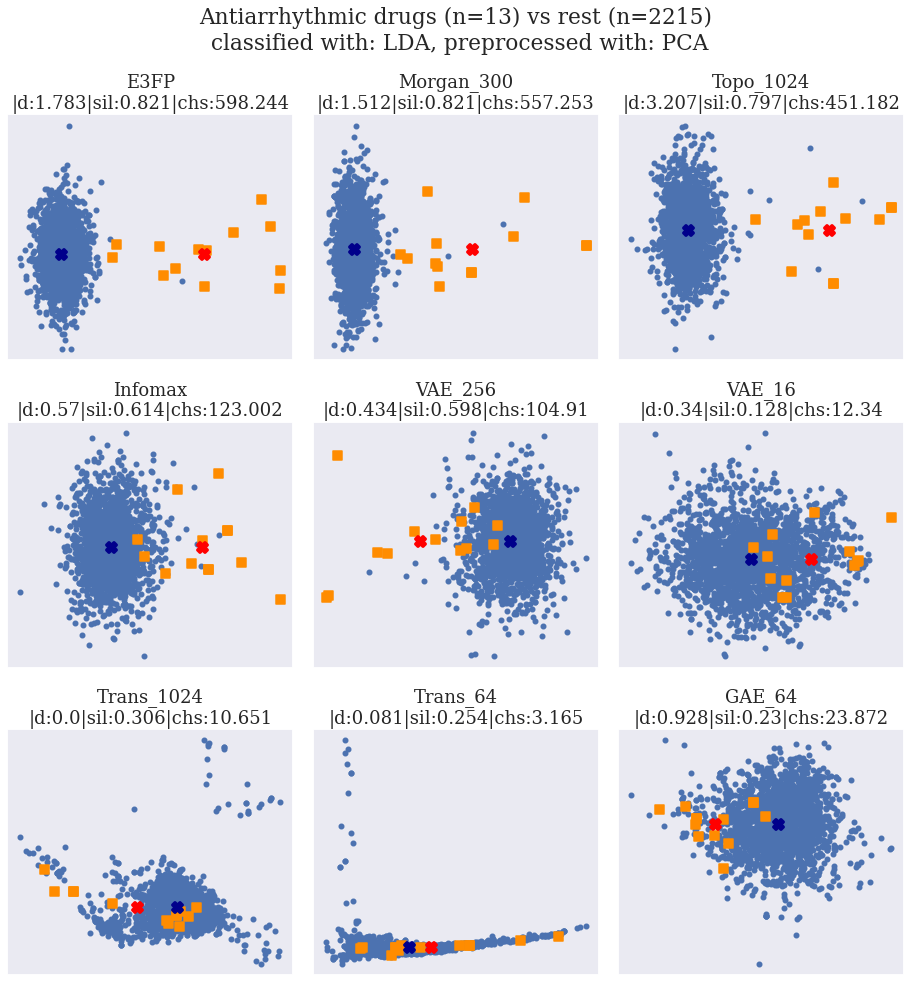

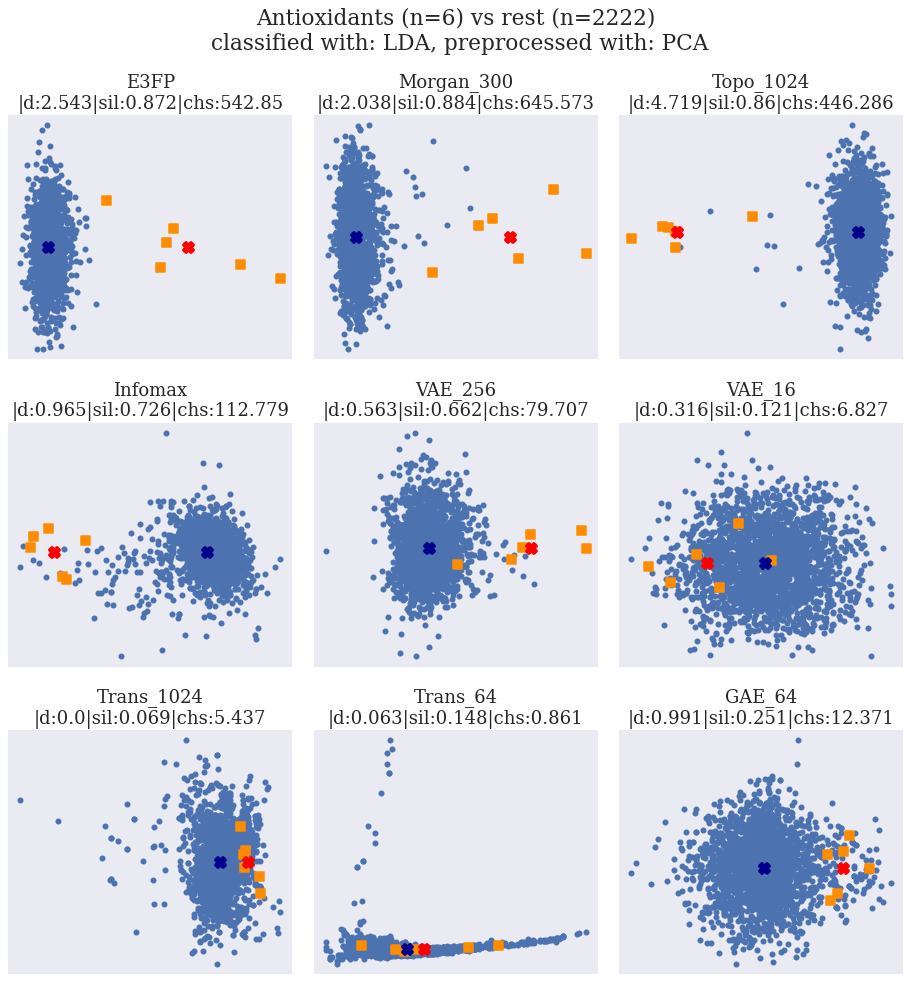

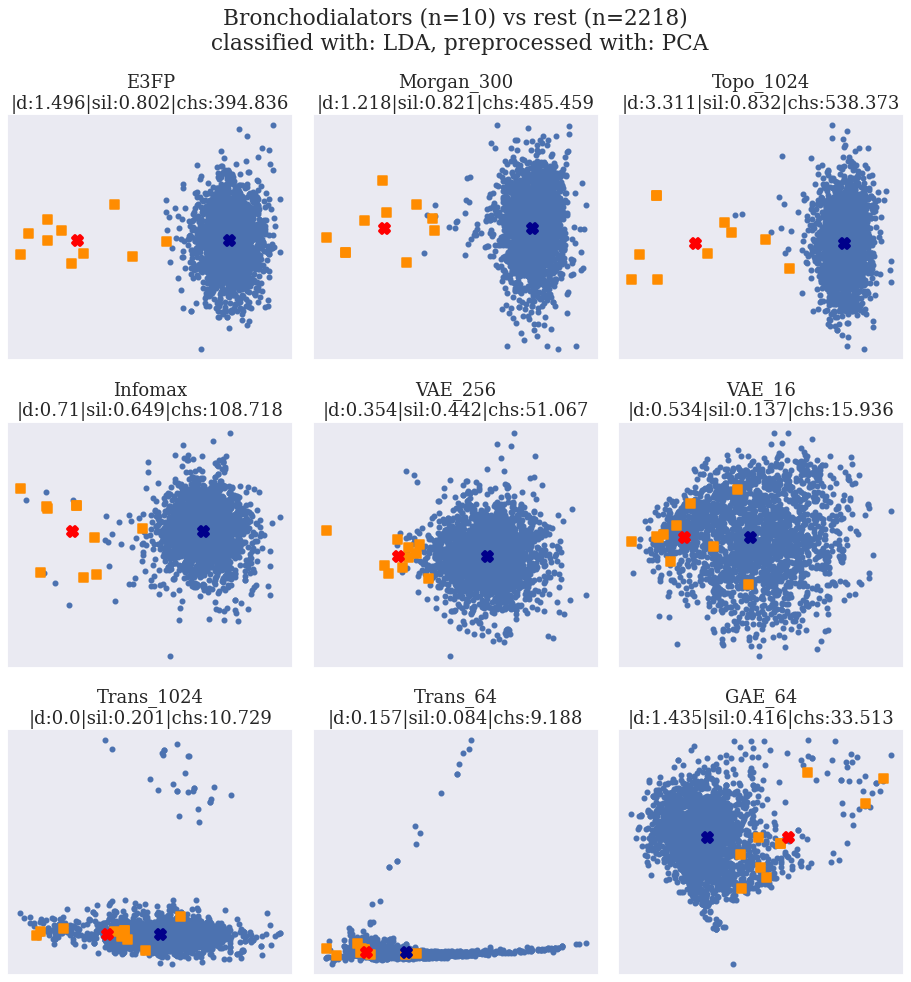

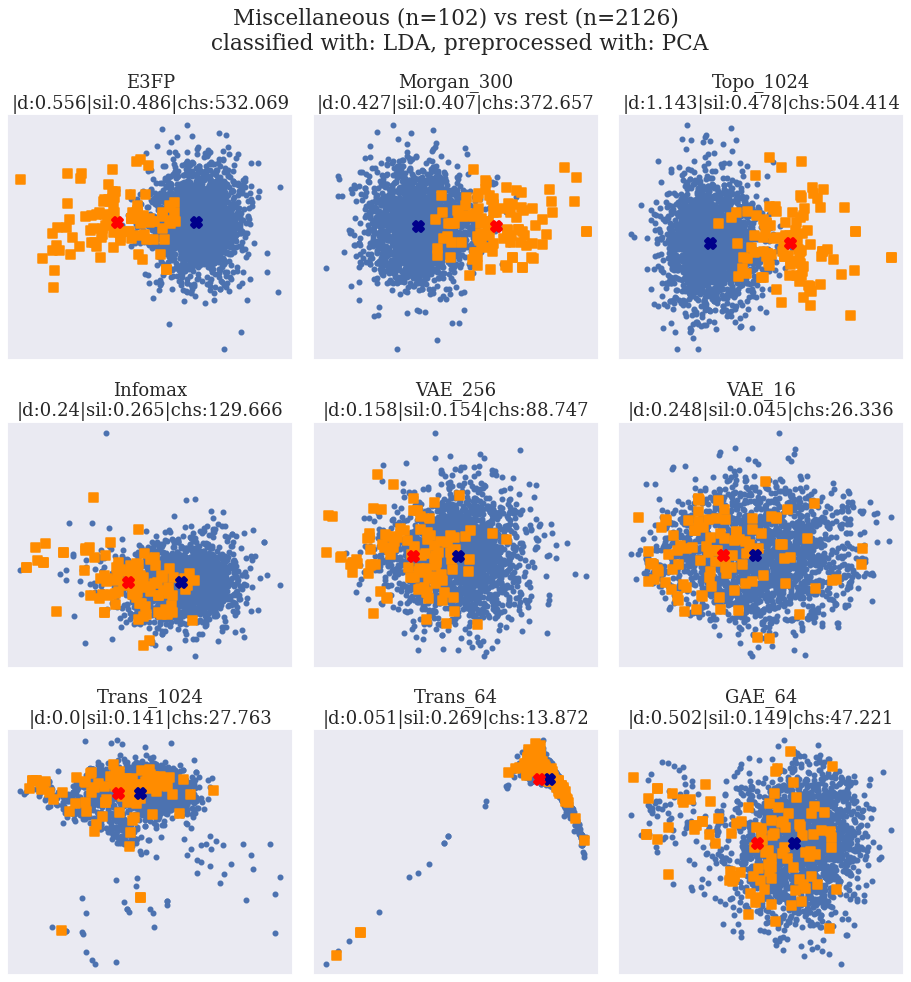

In [517]:
#LDA #  #'Cholesterol medications',
distances = dict()
silhouettes = dict()
chs = dict()
for i in ['Kinase-targeting drugs', 'Alkaloids', 'Antimetabolites', 'Drugs targeting Nucleic Acids',\
          'Antiinfectives', 'Hormones', 'Antiinflamatory', 'Antidiabetic drugs',\
          'Ion channel blockers', 'P450 modulators', 'Alkylating agents', 'Antiepileptics',\
          'Antagonists', 'Inhibitors', 'Immunosuppressants', 'Vitamers and their derivatives',\
          'Agonists', 'Diuretics', 'Antiarrhythmic drugs', 'Antioxidants', 'Bronchodialators', 'Miscellaneous']:
    values, ds, sils, chs_vals = clustering.plot_projections(
        holder = holder, 
        labels = labels, 
        class_name = i, 
        preprocess_lda = 'PCA',
        only_pca = False,
        binarize_class = True,
        standardize = False, 
        return_distances = True
    )
    distances[i] = ds
    silhouettes[i] = sils
    chs[i] = chs_vals
    print(i)
                                      

In [518]:
from collections import defaultdict 

s = defaultdict(int)
for key in distances.keys():
    temp = distances[key]
    for k,v in temp.items():
        k = k.split(' ')[-1]
        s[k] += v
        
s1 = defaultdict(int)
for key in silhouettes.keys():
    temp = silhouettes[key]
    for k,v in temp.items():
        k = k.split(' ')[-1]
        s1[k] += v
        
s2 = defaultdict(int)
for key in chs.keys():
    temp = chs[key]
    for k,v in temp.items():
        k = k.split(' ')[-1]
        s2[k] += v
        
s = pd.DataFrame(data=s.values(), index=s.keys(), columns=['overall_separation'])\
.sort_values(by='overall_separation', axis=0, ascending=False)

s1 = pd.DataFrame(data=s1.values(), index=s1.keys(), columns=['overall_silhouette'])\
.sort_values(by='overall_silhouette', axis=0, ascending=False)

s2 = pd.DataFrame(data=s2.values(), index=s2.keys(), columns=['overall_chs'])\
.sort_values(by='overall_chs', axis=0, ascending=False)

s_PCA_scaler = s[['overall_separation']]\
.merge(s1[['overall_silhouette']], left_index=True, right_index=True)\
.merge(s2[['overall_chs']], left_index=True, right_index=True)\
.sort_values(by='overall_chs', ascending=False)

Kinase-targeting drugs
Alkaloids
Antimetabolites
Drugs targeting Nucleic Acids
Antiinfectives
Hormones
Antiinflamatory
Antidiabetic drugs
Ion channel blockers
P450 modulators
Alkylating agents
Antiepileptics
Antagonists
Inhibitors
Immunosuppressants
Vitamers and their derivatives
Agonists
Diuretics
Antiarrhythmic drugs
Antioxidants


/tf/notebooks/code_for_pub/mymodule/clustering.py:215: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  distances = dict()


Bronchodialators
Miscellaneous


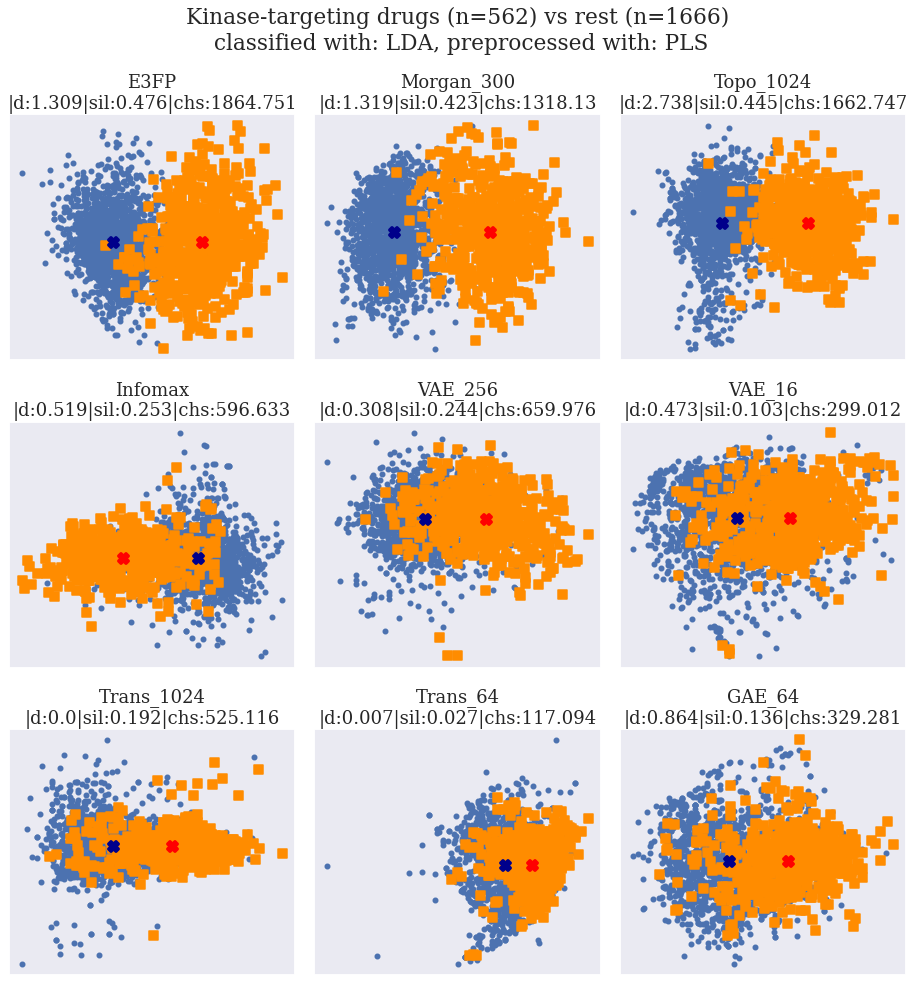

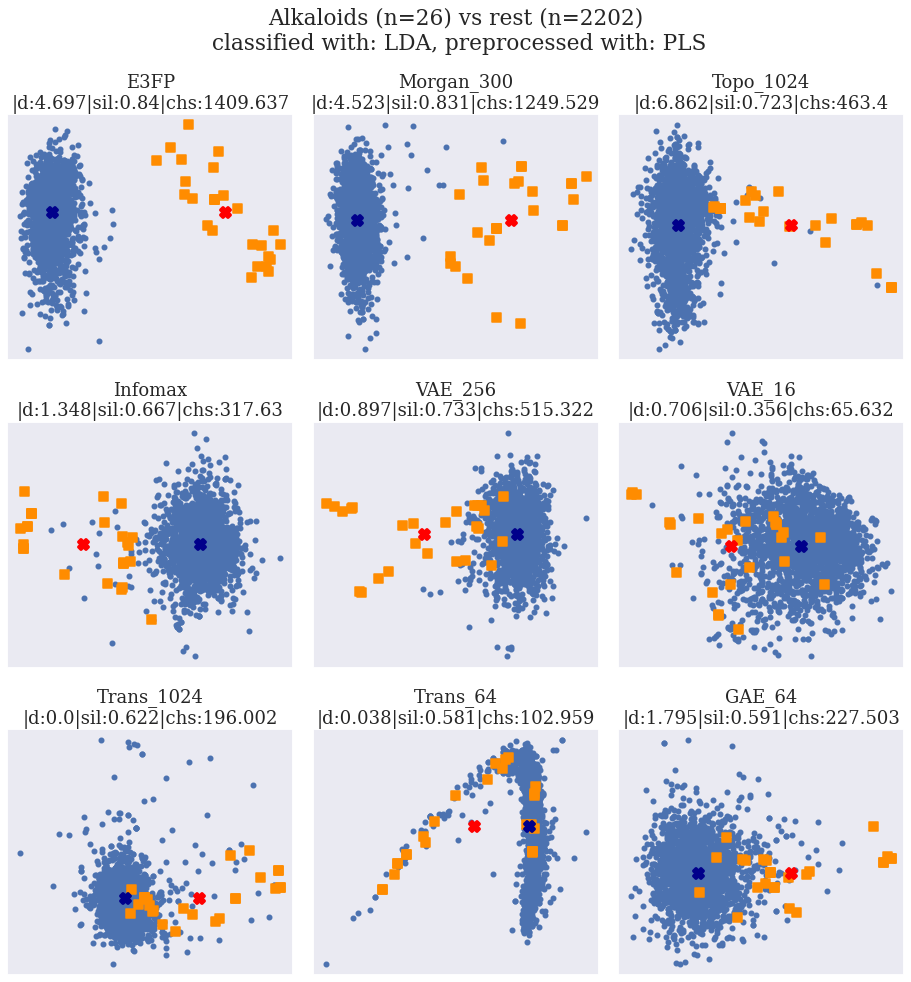

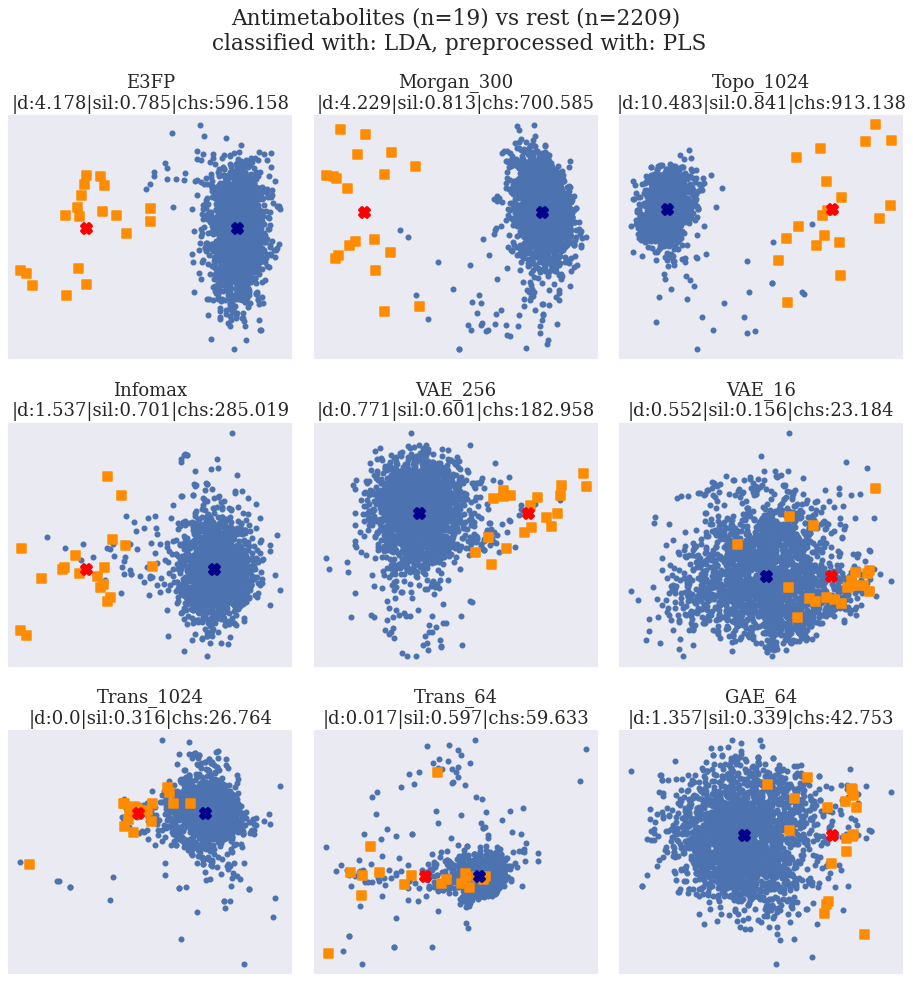

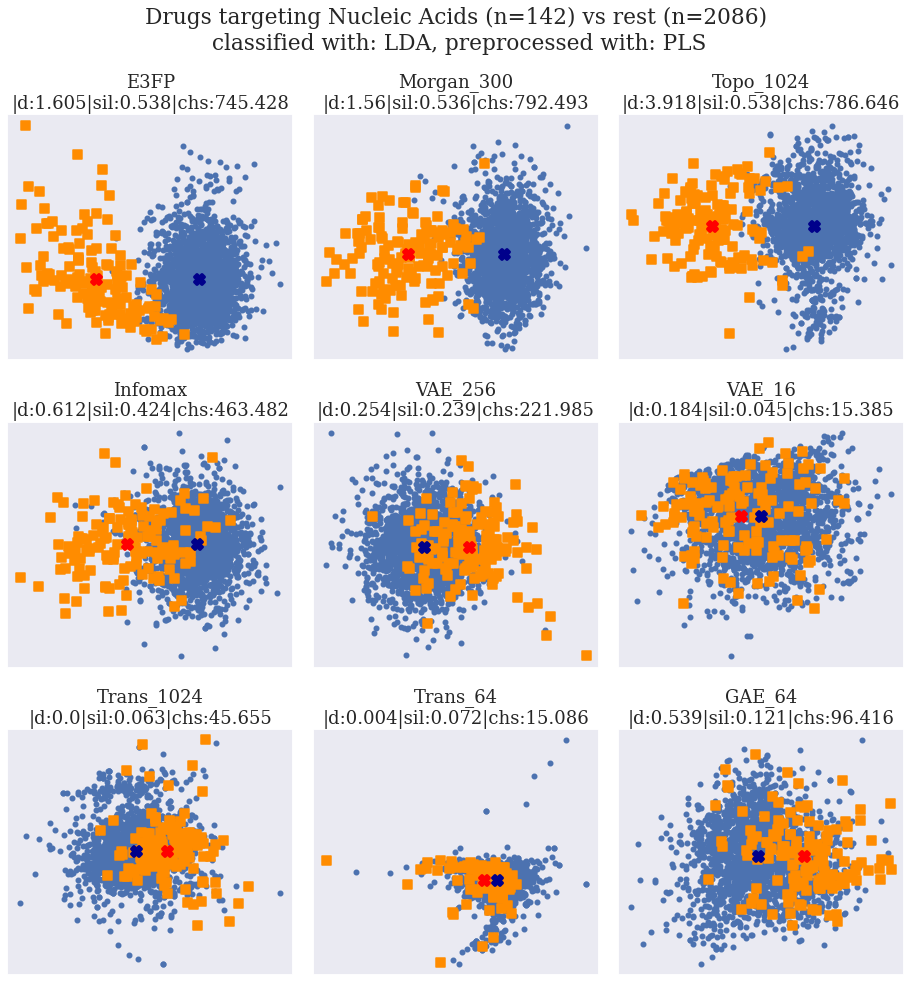

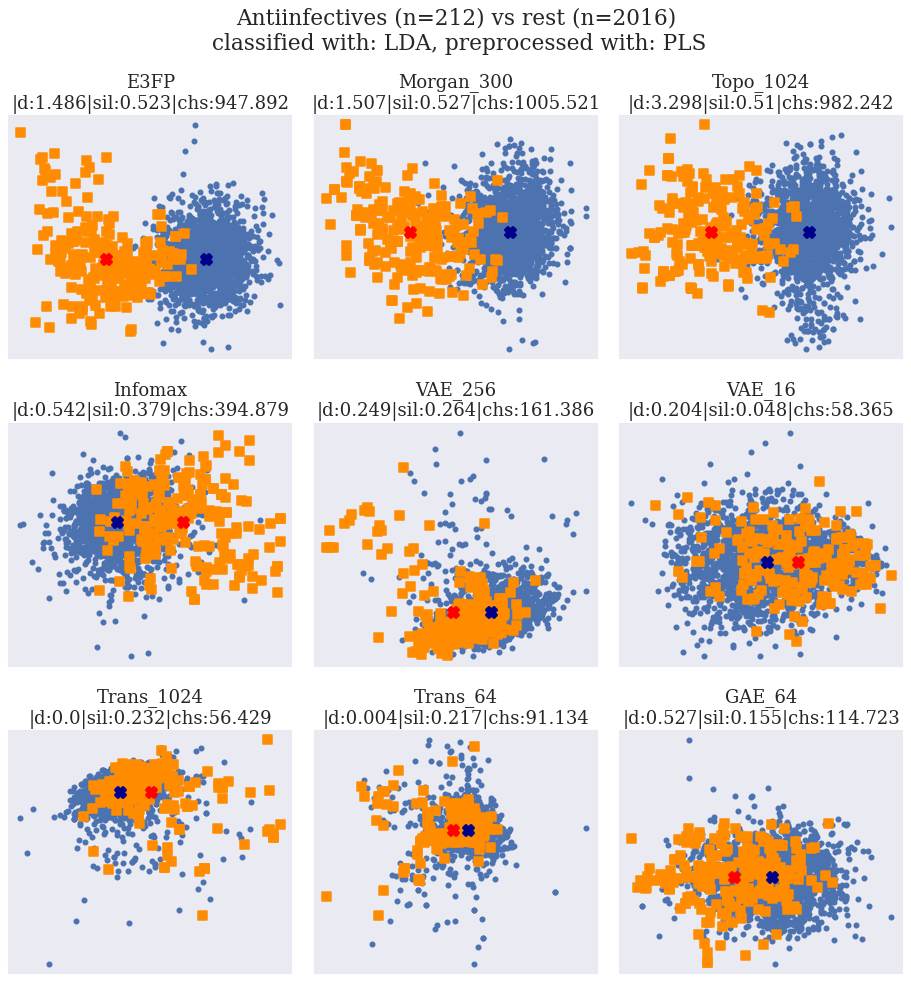

...

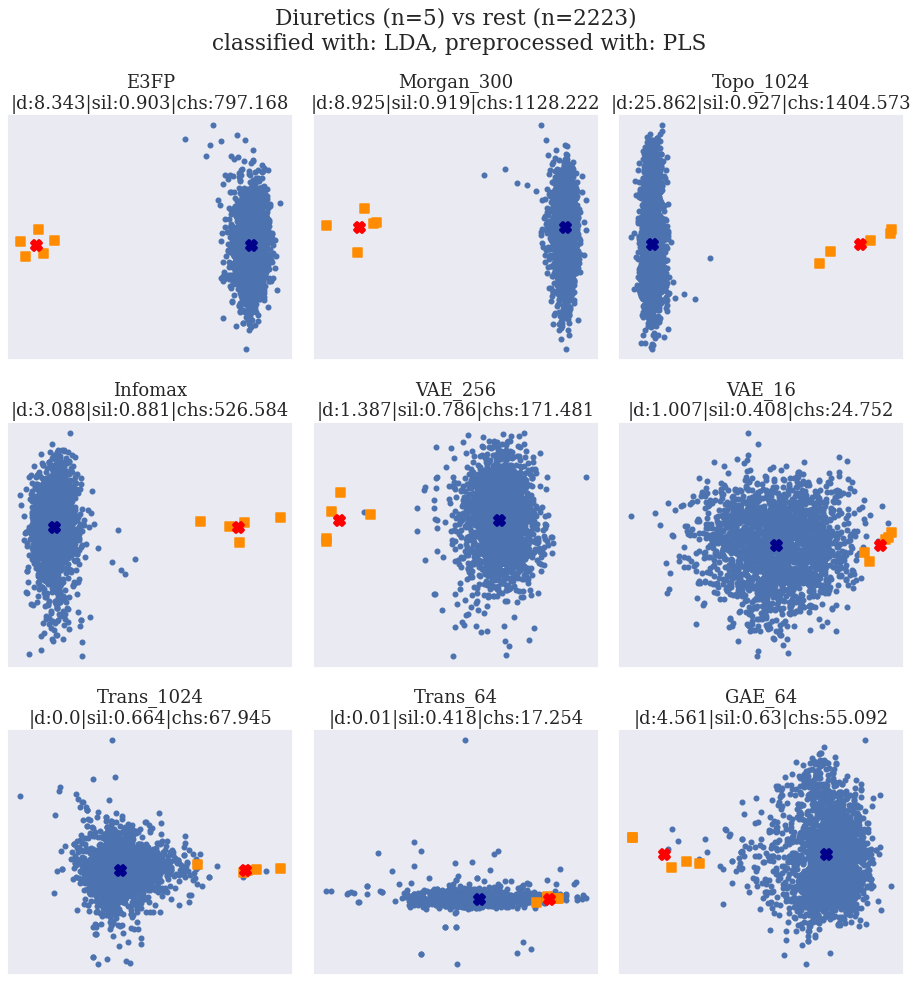

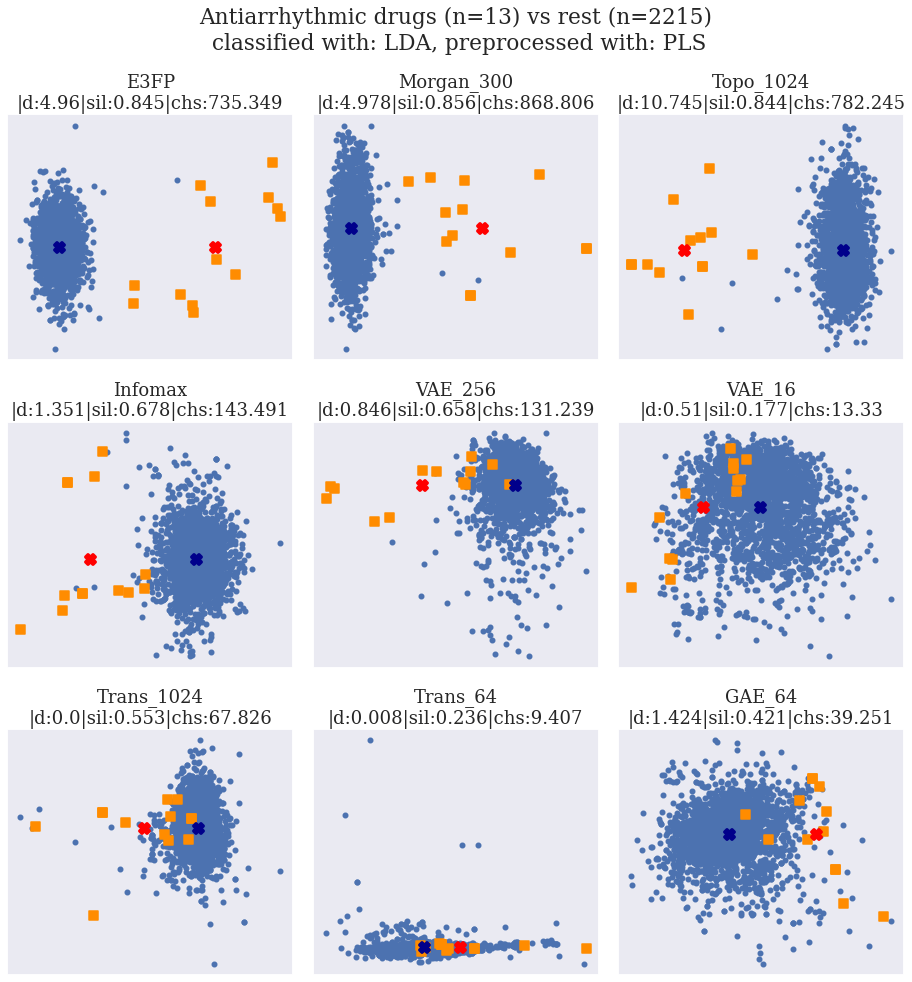

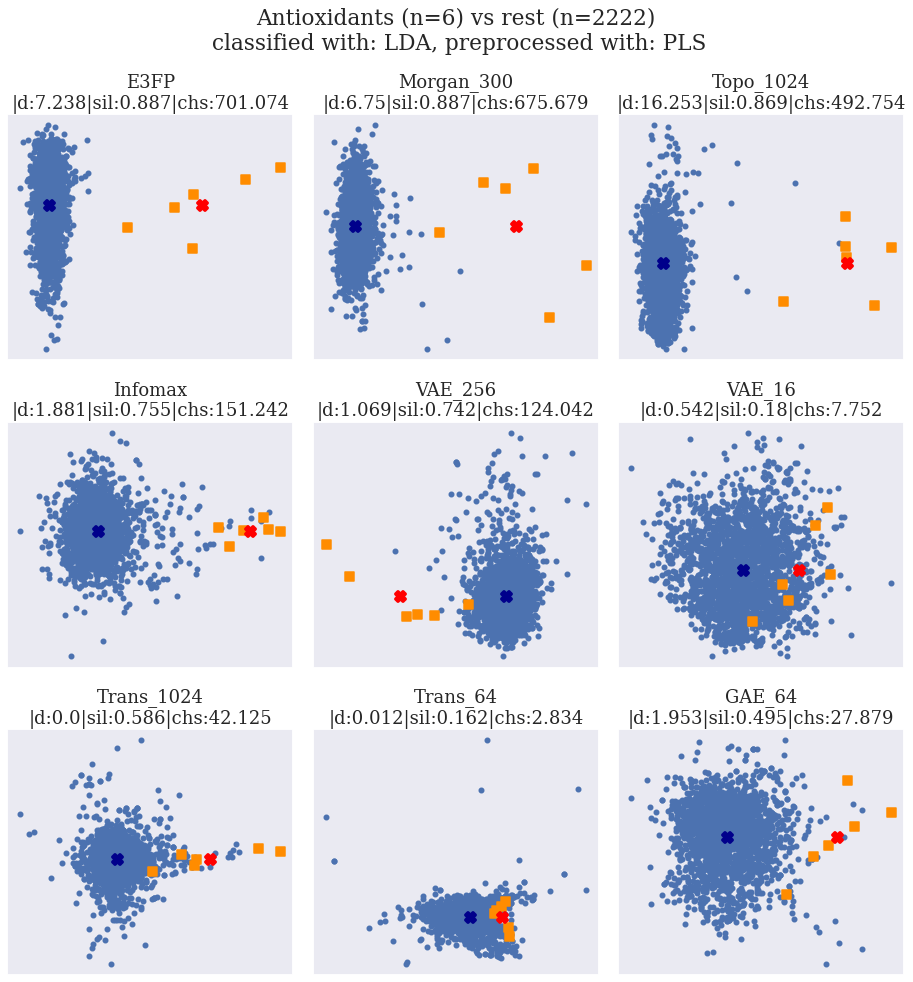

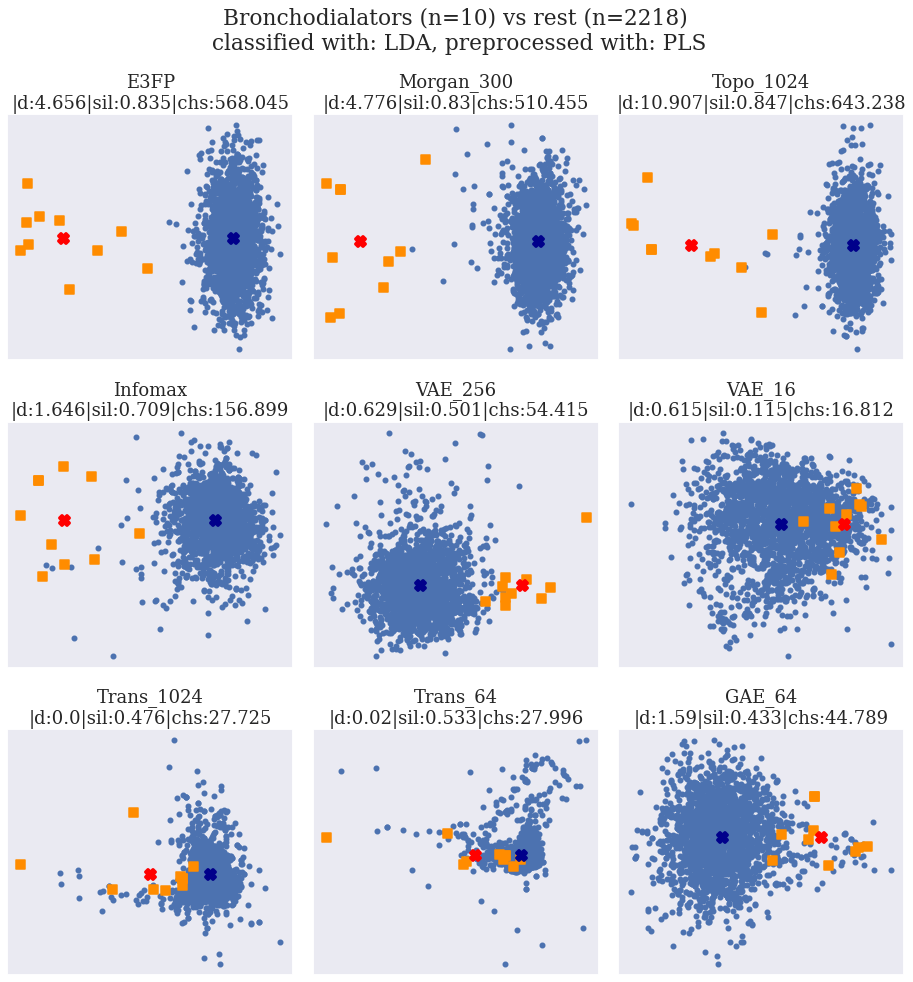

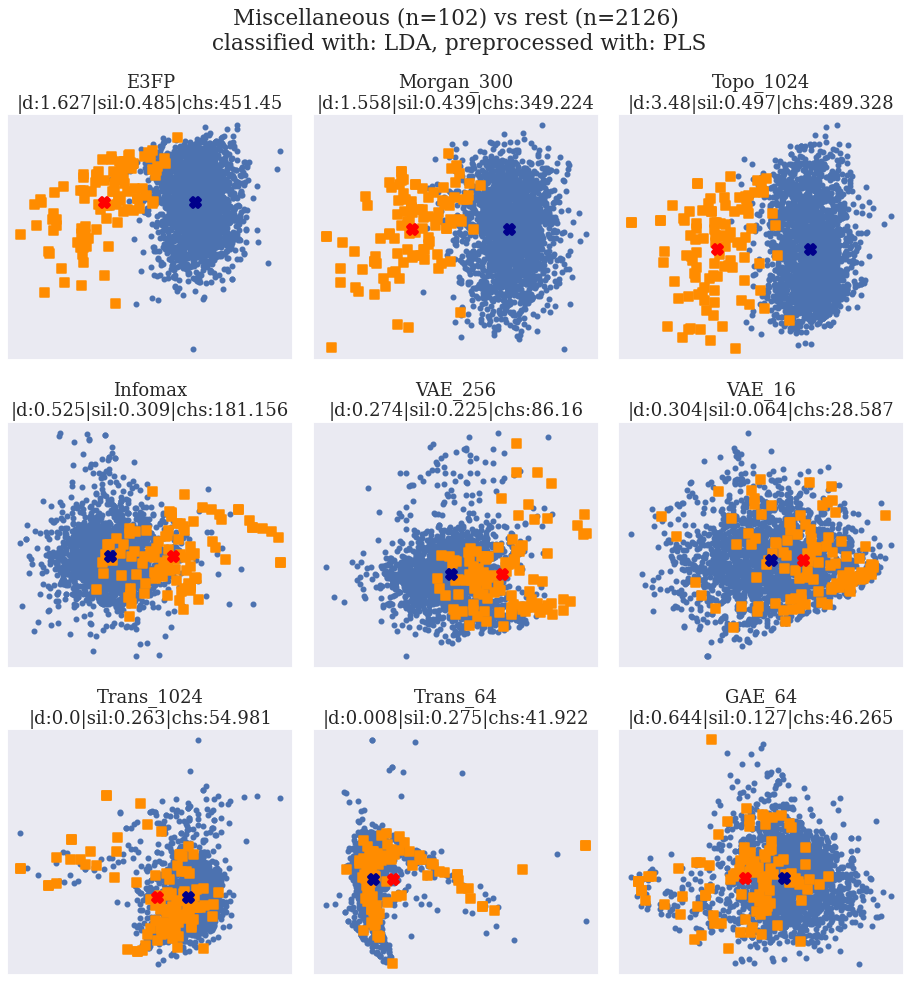

In [519]:
#LDA #  #'Cholesterol medications',
distances = dict()
silhouettes = dict()
chs = dict()
for i in ['Kinase-targeting drugs', 'Alkaloids', 'Antimetabolites', 'Drugs targeting Nucleic Acids',\
          'Antiinfectives', 'Hormones', 'Antiinflamatory', 'Antidiabetic drugs',\
          'Ion channel blockers', 'P450 modulators', 'Alkylating agents', 'Antiepileptics',\
          'Antagonists', 'Inhibitors', 'Immunosuppressants', 'Vitamers and their derivatives',\
          'Agonists', 'Diuretics', 'Antiarrhythmic drugs', 'Antioxidants', 'Bronchodialators', 'Miscellaneous']:
    values, ds, sils, chs_vals = clustering.plot_projections(
        holder = holder, 
        labels = labels, 
        class_name = i, 
        preprocess_lda = 'PLS',
        only_pca = False,
        binarize_class = True,
        standardize = False, 
        return_distances = True)
    distances[i] = ds
    silhouettes[i] = sils
    chs[i] = chs_vals
    print(i)
                                      

In [520]:
from collections import defaultdict 

s = defaultdict(int)
for key in distances.keys():
    temp = distances[key]
    for k,v in temp.items():
        k = k.split(' ')[-1]
        s[k] += v
        
s1 = defaultdict(int)
for key in silhouettes.keys():
    temp = silhouettes[key]
    for k,v in temp.items():
        k = k.split(' ')[-1]
        s1[k] += v
        
s2 = defaultdict(int)
for key in chs.keys():
    temp = chs[key]
    for k,v in temp.items():
        k = k.split(' ')[-1]
        s2[k] += v
        
s = pd.DataFrame(data=s.values(), 
                 index=s.keys(), 
                 columns=['overall_separation'])\
.sort_values(by='overall_separation', axis=0, ascending=False)

s1 = pd.DataFrame(data=s1.values(), 
                  index=s1.keys(), 
                  columns=['overall_silhouette'])\
.sort_values(by='overall_silhouette', axis=0, ascending=False)

s2 = pd.DataFrame(data=s2.values(), 
                  index=s2.keys(), 
                  columns=['overall_chs'])\
.sort_values(by='overall_chs', axis=0, ascending=False)

s_PLS_scaler = s[['overall_separation']]\
.merge(s1[['overall_silhouette']], left_index=True, right_index=True)\
.merge(s2[['overall_chs']], left_index=True, right_index=True)\
.sort_values(by='overall_chs', ascending=False)

In [946]:
# using minmaxscaler standardize 
s_minmax_n1 = s_none_scaler.loc[:,['overall_silhouette','overall_chs']]
s_minmax_pc1 = s_PCA_scaler.loc[:,['overall_silhouette','overall_chs']]
s_minmax_pl1 = s_PLS_scaler.loc[:,['overall_silhouette','overall_chs']]

col_names_lower=['Avg Silhouette', 'Variance Ratio Criterion']

s_minmax_n1.columns = pd.MultiIndex.from_arrays([['None']*2, col_names_lower])
s_minmax_pc1.columns = pd.MultiIndex.from_arrays([['PCA']*2, col_names_lower])
s_minmax_pl1.columns = pd.MultiIndex.from_arrays([['PLS']*2, col_names_lower])

df_minmax = s_minmax_n1.merge(s_minmax_pc1, left_index=True, right_index=True)
df_minmax = df_minmax.merge(s_minmax_pl1, left_index=True, right_index=True)/22

In [947]:
# using z-score
s_n1 = s_none1.loc[:,['overall_silhouette','overall_chs']]
s_pc1 = s_pca1.loc[:,['overall_silhouette','overall_chs']]
s_pl1 = s_pls1.loc[:,['overall_silhouette','overall_chs']]

col_names_lower=['Avg Silhouette', 'Variance Ratio Criterion']

s_n1.columns = pd.MultiIndex.from_arrays([['None']*2, col_names_lower])
s_pc1.columns = pd.MultiIndex.from_arrays([['PCA']*2, col_names_lower])
s_pl1.columns = pd.MultiIndex.from_arrays([['PLS']*2, col_names_lower])

df = s_n1.merge(s_pc1, left_index=True, right_index=True)
df = df.merge(s_pl1, left_index=True, right_index=True)/22

In [948]:
# scaling results to be in {0,1}
from sklearn.preprocessing import MinMaxScaler

mms = MinMaxScaler()
data = pd.DataFrame(
    data = np.round(mms.fit_transform(df), decimals=3),
    index = df.index, 
    columns=df.columns
)
mms = MinMaxScaler()
data_minmax = pd.DataFrame(
    data = np.round(mms.fit_transform(df_minmax), decimals=3),
    index = df_minmax.index,
    columns=df_minmax.columns
)


In [949]:
h = pd.DataFrame(data=np.zeros((22,10)))
counter = 0

for k,v in chs.items():
    temp = []
    temp.append(k)
    for key,value in v.items():
        temp.append(value)
    h.iloc[counter,:] = temp
    counter += 1

h.set_index(
    drop=True, 
    keys=[0], 
    inplace=True
)

h.columns = [
    x.split(' ')[1] for x in list(v.keys())
] 

h.sort_values(
    by=list(h.columns), 
    ascending=len(h.columns)*[False]
)

,E3FP,Morgan_300,Topo_1024,Infomax,VAE_256,VAE_16,Trans_1024,Trans_64,GAE_64
0,,,,,,,,,
Kinase-targeting drugs,1864.751,1318.130,1662.747,596.633,659.976,299.012,525.116,117.094,329.281
Alkaloids,1409.637,1249.529,463.400,317.630,515.322,65.632,196.002,102.959,227.503
Antiinfectives,947.892,1005.521,982.242,394.879,161.386,58.365,56.429,91.134,114.723
Vitamers and their derivatives,900.298,742.697,750.779,311.736,149.290,12.457,76.678,15.257,98.457
Agonists,875.960,663.131,502.112,156.743,115.866,14.734,31.164,11.887,26.666
Hormones,839.596,976.533,810.359,448.221,398.233,102.483,203.857,104.493,257.069
Antagonists,809.127,927.651,1001.976,210.867,103.090,21.738,40.376,22.952,54.083
Diuretics,797.168,1128.222,1404.573,526.584,171.481,24.752,67.945,17.254,55.092
Drugs targeting Nucleic Acids,745.428,792.493,786.646,463.482,221.985,15.385,45.655,15.086,96.416


### z-score

In [950]:
S_better_PCA = np.greater(data.iloc[:,2], data.iloc[:,0])
F_better_PCA = np.greater(data.iloc[:,3], data.iloc[:,1])
S_better_PLS = np.greater(data.iloc[:,4], data.iloc[:,0])
F_better_PLS = np.greater(data.iloc[:,5], data.iloc[:,1])

temp = data.copy()
temp.iloc[:,:] = np.round(temp.iloc[:,:].values, decimals=2)
temp['S_better_PCA'] = S_better_PCA
temp['F_better_PCA'] = F_better_PCA
temp['S_better_PLS'] = S_better_PLS
temp['F_better_PLS'] = F_better_PLS

# silhoutte 
temp = data.merge(temp[['S_better_PCA','F_better_PCA','S_better_PLS',  'F_better_PLS']],
                  left_index=True, 
                  right_index=True)

# sorting by No preprocessing
order = temp.iloc[:, [0,1]]\
.mean(axis=1)\
.sort_values(ascending=False)\
.index

temp = temp.loc[order]
cols = pd.MultiIndex.from_arrays([
    ['None','None','PCA','PCA','PLS','PLS','PCA enhances','PCA enhances','PLS enhances','PLS enhances'],
    ['n_avgSilhouette', 'n_VRC','n_avgSilhouette', 'n_VRC','n_avgSilhouette', 'n_VRC',\
     'n_avgSilhouette', 'n_VRC','n_avgSilhouette', 'n_avgVRC']
])
temp.columns = cols

#
ranks = {k:v for k,v in zip(order, range(1, len(order)+1))}

temp[('rank','before dim reduction')] = [ranks[x] for x in order]
temp[('rank','after dim reduction')] = [
    ranks[x] for x in temp.iloc[:,[2,3,4,5]]\
    .mean(axis=1)\
    .sort_values(ascending=False)\
    .index
]
temp[('benefits from','dim reduction')] = np.greater(
    df.loc[temp.index].iloc[:,[2,3,4,5]]\
    .mean(axis=1),
    df.loc[temp.index].iloc[:,[0,1]]\
    .mean(axis=1)
)

print(temp.iloc[:,[0,1,2,3,4,5,10,11,12]]\
      .to_latex(index=True,
                multicolumn=True,
                bold_rows=True,
                multirow=True,
                longtable=False)
     )


\begin{tabular}{lrrrrrrrrl}
\toprule
{} & \multicolumn{2}{l}{None} & \multicolumn{2}{l}{PCA} & \multicolumn{2}{l}{PLS} & \multicolumn{2}{l}{rank} & benefits from \\
{} & n\_avgSilhouette &  n\_VRC & n\_avgSilhouette &  n\_VRC & n\_avgSilhouette &  n\_VRC & before dim reduction & after dim reduction & dim reduction \\
\midrule
\textbf{Infomax   } &           0.984 &  1.000 &           0.701 &  0.251 &           0.749 &  0.326 &                    1 &                   3 &         False \\
\textbf{E3FP      } &           1.000 &  0.831 &           0.993 &  0.958 &           0.988 &  0.959 &                    2 &                   4 &          True \\
\textbf{Topo\_1024 } &           0.979 &  0.771 &           1.000 &  0.997 &           1.000 &  1.000 &                    3 &                   2 &          True \\
\textbf{Morgan\_300} &           0.967 &  0.655 &           0.993 &  1.000 &           0.997 &  0.984 &                    4 &                   1 &          True \\
\textbf{GA

In [915]:
temp.iloc[:, range(6)].T.corr(method='spearman')

,Infomax,E3FP,Topo_1024,Morgan_300,GAE_64,VAE_256,VAE_16,Trans_64,Trans_1024
Infomax,1.000000,0.085714,-0.576818,-0.771429,0.600000,-0.028571,0.371429,0.698253,-0.405840
E3FP,0.085714,1.000000,0.333947,0.028571,0.714286,0.771429,0.428571,0.273230,0.231908
Topo_1024,-0.576818,0.333947,1.000000,0.576818,-0.151794,0.698253,-0.516100,-0.225806,0.924062
Morgan_300,-0.771429,0.028571,0.576818,1.000000,-0.142857,0.371429,-0.485714,-0.212512,0.637748
GAE_64,0.600000,0.714286,-0.151794,-0.142857,1.000000,0.600000,0.428571,0.758971,0.000000
VAE_256,-0.028571,0.771429,0.698253,0.371429,0.600000,1.000000,-0.142857,0.394665,0.753702
VAE_16,0.371429,0.428571,-0.516100,-0.485714,0.428571,-0.142857,1.000000,-0.091077,-0.608760
Trans_64,0.698253,0.273230,-0.225806,-0.212512,0.758971,0.394665,-0.091077,1.000000,0.000000
Trans_1024,-0.405840,0.231908,0.924062,0.637748,0.000000,0.753702,-0.608760,0.000000,1.000000


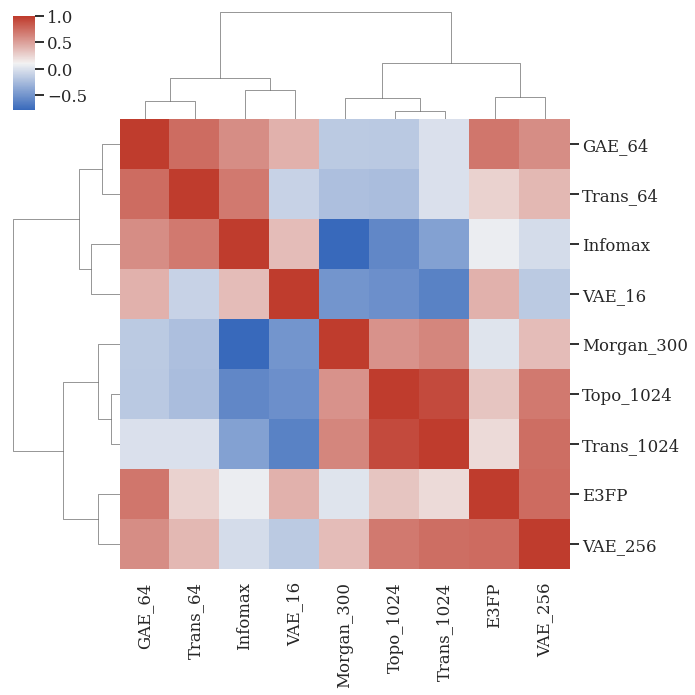

In [917]:
t = temp.iloc[:, range(6)].T.corr(method='spearman')
g = sns.clustermap(t, 
                   method='ward', # average, weighted, single, complete, ward, centroid, median
                   colors_ratio=0.05, 
                   dendrogram_ratio=0.2,
                   cbar_pos= (0.035, 0.83, 0.03, 0.13), #  (left, bottom, width, height),
                   cmap=sns.diverging_palette(255, 15, s=80, l=45, sep=1, as_cmap=True))

#g.ax_heatmap.tick_params(right=False, bottom=False)
#g.savefig('/tf/notebooks/code_for_pub/FIGURES/heatmap_CKA.png', dpi=400)
#g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), rotation=75)


In [334]:
def plot_single_projection_mod(holder, 
                           labels, 
                           class_name='Antioxidants', 
                           fp_name ='fps_e3fp_1024bit', 
                           standardize=True, 
                           preprocess_lda='PCA'):
    '''
    holder should be a dictionary with df's as values and fp-filenames as keys
    labels should be a mapping of DrugCombID: ATC_class
    '''

    from mlxtend.preprocessing import standardize as st
    from sklearn.preprocessing import LabelEncoder
    from sklearn.cluster import KMeans
    from mlxtend.feature_extraction import LinearDiscriminantAnalysis #in sklearn LDA i'd need to add a dummy class if i want to have 2 components after trasnformation
    from scipy.spatial.distance import pdist
    from sklearn.metrics import silhouette_score as sil
    from sklearn.metrics import silhouette_samples as sil_sample
    from sklearn.metrics import calinski_harabasz_score as chs

    
    df_cluster = holder[fp_name].copy()
    df_cluster = df_cluster.loc[df_cluster.index.isin(labels.keys())]
    df_cluster = df_cluster[~df_cluster.index.duplicated(keep='last')]

    if standardize:
        classes = df_cluster.index.copy()
        df_cluster.reset_index(inplace=True, drop=True)
        df_cluster = st(df_cluster)
    else:
        classes = df_cluster.index.copy()
    df_cluster['classes'] = classes # our classes are mapped to index in labels dictionary
    df_cluster['classes'] = df_cluster['classes'].map(labels)

    df_cluster.loc[df_cluster.classes != class_name,'classes'] = 'not '+'class_name'
    #dummy = [0]*(df_cluster.shape[1]-1) + ['dummy']
    #df_cluster.loc[df_cluster.shape[0]] = dummy

    # change labels from str to int
    enc = LabelEncoder() 
    real_classes = df_cluster.loc[:,'classes']
    df_cluster.loc[:,'classes'] = enc.fit_transform(df_cluster['classes'])
    classes = df_cluster.pop('classes')

    if preprocess_lda == 'PLS':
        from sklearn.cross_decomposition import PLSRegression
        pls = PLSRegression(n_components=10, scale=False)
        temp = pls.fit_transform(df_cluster.values, classes.values)[0]
    elif preprocess_lda == 'PCA':
        from sklearn.decomposition import PCA 
        pca = PCA(n_components=0.95, svd_solver='full', whiten=False)
        temp = pca.fit_transform(df_cluster.values)
    elif preprocess_lda == 'kernelPCA':
        from sklearn.decomposition import KernelPCA
        pca = KernelPCA(kernel="rbf", gamma=5)
        temp = pca.fit_transform(df_cluster.values)
    elif preprocess_lda == 'NONE':
        temp = df_cluster.values
    elif preprocess_lda == 'NCA':
        from sklearn.neighbors import NeighborhoodComponentsAnalysis
        nca = NeighborhoodComponentsAnalysis()
        temp = nca.fit_transform(df_cluster.values, classes.values)
            

    #lda = LinearDiscriminantAnalysis(solver='eigen', shrinkage='auto')
    #lda.fit(temp, classes.values)
    #temp1 = lda.transform(temp)

    lda = LinearDiscriminantAnalysis(n_discriminants=2)
    lda.fit(temp, classes.values)
    temp = lda.transform(temp)
    with warnings.catch_warnings():
        warnings.filterwarnings('ignore', 'Casting complex values to real discards the imaginary part')
        temp = temp.astype(np.float) # in case of complex numbers///

    df = pd.DataFrame(index=df_cluster.index, columns=[0,1], data=temp)
    df['classes'] = real_classes


    km = KMeans(init='k-means++', n_clusters=1, n_init=10)
    km.fit(df.loc[df.classes != class_name, [0,1]])

    km1 = KMeans(init='k-means++', n_clusters=1, n_init=10)
    km1.fit(df.loc[df.classes == class_name, [0,1]])

    d = round(pdist([km.cluster_centers_[0], km1.cluster_centers_[0]])[0],3)
    d_sc = sil(df.loc[:, [0,1]], df['classes'])
    sample_silhouette_values = sil_sample(df.loc[:, [0,1]], df['classes'])
    d_chs = round(chs(df.loc[:, [0,1]], df['classes']), 3)
    
    
    
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18,7))

    ax1.set_xlim([-1, 1])
    #ax1.set_ylim([0, len(df) + (len(np.unique(df['classes'])) + 1) * 10])
    y_lower = 10
    prev = list()
    for ind,i in enumerate(np.unique(df['classes'])):
        prev.append(i)
        ith_cluster_silhouette_values = \
            sample_silhouette_values[df['classes'] == i]
        ith_cluster_silhouette_values.sort()
        if ith_cluster_silhouette_values.shape[0] > 2_100:
            ith_cluster_silhouette_values = np.random.choice(ith_cluster_silhouette_values, 
                                                             size = 3*(2282-ith_cluster_silhouette_values.shape[0]), 
                                                             replace=False)
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        if i == 'not class_name':
            color = 'grey'
        else:
            color = 'darkorange'
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)
        y_lower = y_upper + 10  # 10 for the 0 samples
        
    ax1.axvline(x=d_sc, color="green", linestyle="--")
    ax2.scatter(df.loc[df.classes != class_name, 0],
                 df.loc[df.classes != class_name, 1],
                 marker=',', 
                 color='grey')
    ax2.scatter(df.loc[df.classes == class_name, 0],
                 df.loc[df.classes == class_name, 1],
                 marker=',', 
                 color='darkorange')

    ax2.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:,1], marker='X', color='k', linewidths=30)

    ax2.scatter(km1.cluster_centers_[:,0], km1.cluster_centers_[:,1], marker='X', color='darkred', linewidths=30)

    fig.suptitle(class_name + '\n sil: ' + str(round(d_sc, 3) ) \
                 +' | d: ' + str(d) +  f' | sil x d = {round((d*d_sc),3)}'\
                + ' | d_chs: ' + str(d_chs))
    
    return fig


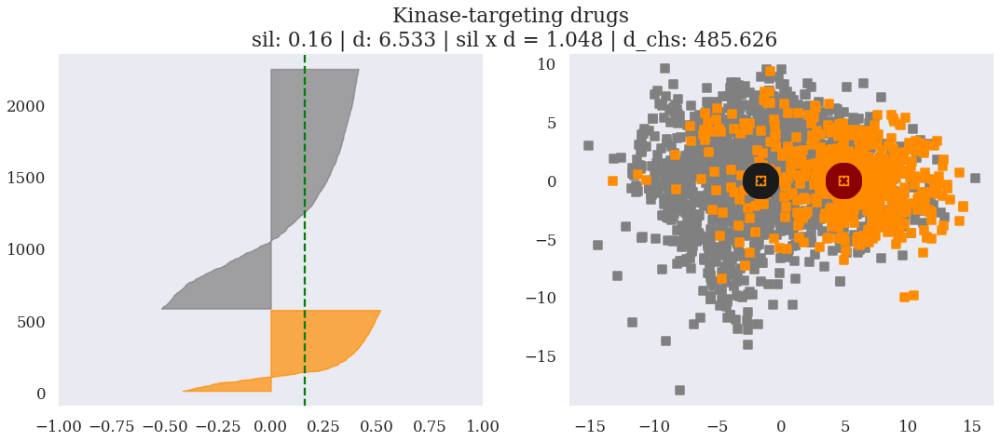

In [339]:
f = plot_single_projection_mod(
    holder=holder,
    labels=labels,
    class_name='Kinase-targeting drugs',
    fp_name='fps_transformer_1024bit_new',
    standardize=True,
    preprocess_lda='PCA')

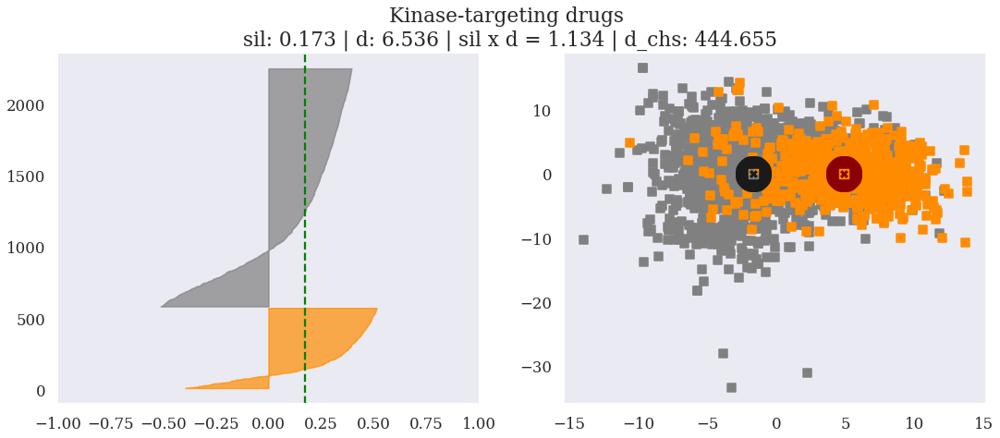

In [338]:
f = plot_single_projection_mod(
    holder=holder,
    labels=labels,
    class_name='Kinase-targeting drugs',
    fp_name='fps_transformer_1024bit_new',
    standardize=True,
    preprocess_lda='PLS')

In [337]:
holder.keys()

dict_keys(['fps_morgan_1024bit', 'fps_transformer_64bit_new', 'fps_VAE_256bit_new', 'fps_topo_1024bit', 'fps_infomax_new', 'fps_morgan_300bit', 'fps_topo_300bit', 'fps_gae_64bit_new', 'fps_transformer_1024bit_new', 'fps_e3fp_1024bit', 'fps_VAE_16bit_new'])

In [82]:
#warnings.filterwarnings(action="error", category=np.ComplexWarning)
# You can reset it to default filters with warnings.resetwarnings.



## Let's look into how similarly distance functions cluster molecules

In [83]:
holder['fps_gae_64bit_new']

,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
id,,,,,,,,,,,,,,,,,,,,,
1,-0.447415,-0.416763,-0.588762,0.173186,0.370261,0.514496,-0.192605,0.124514,-0.660691,-0.510325,...,0.014349,0.013687,0.003761,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.337262,0.025189,-0.210434,-0.034051,-0.569774,0.141506,0.082617,0.466110,-0.325495,0.022543,...,0.421431,0.256737,0.181918,0.151515,0.094010,0.066132,0.033845,0.020698,0.006474,0.005398
3,0.155385,0.250310,0.065026,-0.138405,-0.065802,0.309196,-0.247189,0.036191,-0.068459,0.232512,...,1.789067,1.395697,0.782205,0.514110,0.439831,0.291434,0.245200,0.218332,0.162357,0.101871
4,0.193614,0.144244,0.061585,-0.127981,0.120919,-0.023204,-0.143859,-0.164646,0.100586,0.324042,...,0.943806,0.554404,0.447886,0.398411,0.277518,0.256672,0.204823,0.150589,0.096848,0.048445
5,-0.486916,-0.176334,-0.082225,-0.209314,0.215113,0.164966,0.102399,0.127553,-0.508189,0.052842,...,0.503276,0.438055,0.399186,0.291554,0.226966,0.152157,0.134223,0.081930,0.070095,0.029397
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4446,0.143320,-0.223080,0.237203,0.287540,-0.004626,0.406130,0.048391,0.026852,-0.118447,-0.027914,...,0.763875,0.528138,0.413705,0.318326,0.254402,0.174289,0.115541,0.062495,0.044163,0.021609
4496,0.351294,-0.096765,-0.195098,-0.089800,-0.292864,-0.059670,0.165047,0.117910,0.031613,-0.057177,...,1.464896,1.289240,0.921602,0.518527,0.437429,0.313417,0.259846,0.250961,0.168817,0.108054
4501,0.126520,0.117428,-0.278360,-0.213017,-0.118491,0.144332,0.298806,-0.134029,0.236469,0.149813,...,1.572522,1.054795,0.875690,0.601629,0.488140,0.368646,0.282735,0.242025,0.184797,0.131749


In [94]:
clustering.get_bulk_similarity(holder['fps_gae_64bit_new'], n_drugs=200, cosine=True, scale=False)

id,1,2,3,4,5,6,7,8,9,10,...,198,199,200,201,202,203,204,205,206,207
id,,,,,,,,,,,,,,,,,,,,,
1,1.0,0.692,0.619,0.696,0.714,0.794,0.789,0.697,0.818,0.668,...,0.702,0.723,0.713,0.815,0.748,0.774,0.676,0.669,0.739,0.724
2,NaN,1.000,0.905,0.934,0.934,0.711,0.764,0.915,0.826,0.958,...,0.907,0.926,0.917,0.883,0.885,0.868,0.911,0.931,0.927,0.879
3,NaN,NaN,1.000,0.959,0.940,0.659,0.711,0.963,0.789,0.960,...,0.886,0.886,0.896,0.838,0.870,0.855,0.958,0.944,0.889,0.866
4,NaN,NaN,NaN,1.000,0.951,0.743,0.786,0.965,0.868,0.953,...,0.915,0.926,0.934,0.901,0.911,0.918,0.968,0.956,0.936,0.913
5,NaN,NaN,NaN,NaN,1.000,0.710,0.793,0.953,0.821,0.971,...,0.926,0.908,0.916,0.882,0.907,0.904,0.948,0.956,0.930,0.879
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.000,0.935,0.895,0.902,0.927
204,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.000,0.943,0.910,0.912
205,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000,0.926,0.912


### plotting compound classes

In [87]:
with open('/tf/notebooks/code_for_pub/smiles_files/smiles_drugcomb_deduplicated.pickle', 'rb') as f:
    temp = pickle.load(f)

In [89]:
classes, counts = np.unique(list(labels.values()), return_counts=True)
classes = np.append(classes, np.asarray(['unknown mechanism of action']))
counts = np.append(counts, np.asarray([3421-counts.sum()]))
class_counts = {string.capwords(k):v for k,v in zip(classes, counts)}
class_counts = sorted(class_counts.items(), key=lambda x: x[1], reverse=True)
class_counts = {k:v for k,v in zip([x[0] for x in class_counts], [x[1] for x in class_counts])}

In [90]:
class_counts

{'Unknown Mechanism Of Action': 1193,
 'Kinase-targeting Drugs': 562,
 'Hormones': 442,
 'Inhibitors': 380,
 'Antiinfectives': 212,
 'Drugs Targeting Nucleic Acids': 142,
 'Miscellaneous': 102,
 'Antagonists': 87,
 'Agonists': 52,
 'Ion Channel Blockers': 47,
 'Alkaloids': 26,
 'Antidiabetic Drugs': 26,
 'Vitamers And Their Derivatives': 26,
 'Antimetabolites': 19,
 'Cholesterol Medications': 17,
 'Antiinflamatory': 16,
 'Antiarrhythmic Drugs': 13,
 'Antiepileptics': 10,
 'Bronchodialators': 10,
 'Cytochrome P450 Modulators': 10,
 'Alkylating Agents': 9,
 'Immunosuppressants': 9,
 'Antioxidants': 6,
 'Diuretics': 5}

In [91]:
'diverging' is not a valid value for name; supported values are 'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'mako', 'mako_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'rocket', 'rocket_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'vlag', 'vlag_r', 'winter', 'winter_r'

SyntaxError: invalid syntax (<ipython-input-91-52a08aadf6c7>, line 1)

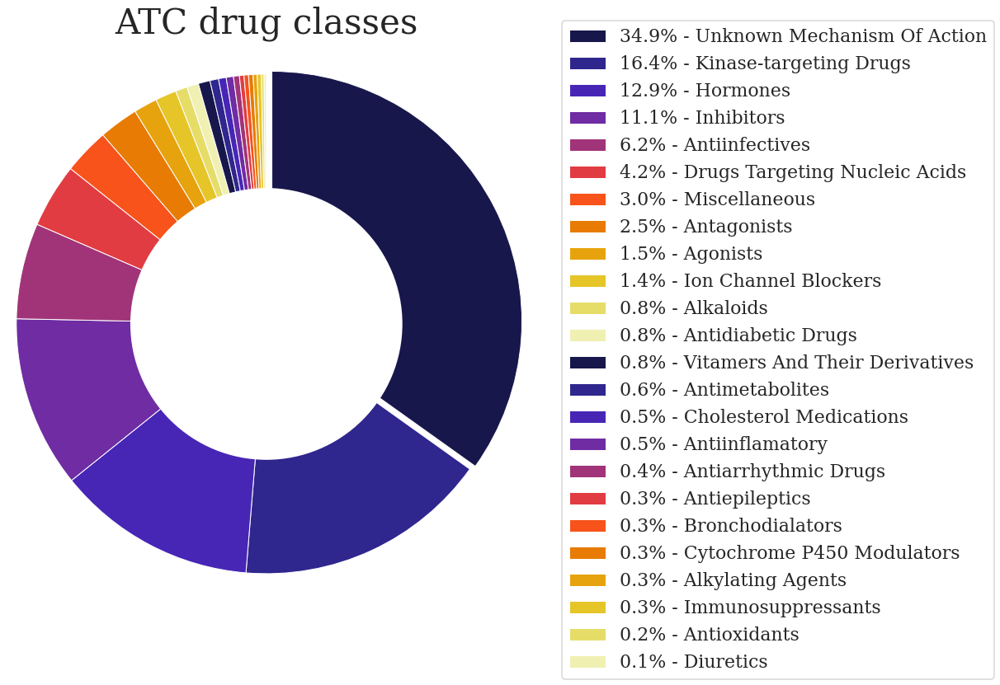

In [92]:
#sns.set(style="ticks")
sns.set(rc={'figure.figsize': (29.7, 21.0)})
sns.set_style("whitegrid")
sns.set_context('talk', font_scale=20)
sns.set_style({'font.family':'serif', 'font.sans-serif':['Helvetica']})


#%% THIS IS A WORKING ONE
fig1, ax1 = plt.subplots(ncols=1)

# drug types
x = list(class_counts.keys())
sizes = list(class_counts.values())
percent = [round(100*size/sum(sizes), 1) for size in sizes]
labels_plot = ['{1:1.1f}% - {0}'.format(i, j) for i, j in zip(x, percent)]

# only "explode" the 1st slice (i.e. 'Unknowns')
explode = [0]*(len(sizes)-1)
explode.insert(0, 0.03)
explode = tuple(explode)
patches, _ = ax1.pie(sizes, 
                     startangle=90, 
                     counterclock=False,
                     radius=1.2, 
                     explode=explode, 
                     colors=sns.color_palette("CMRmap", n_colors = len(x)//2),
                     wedgeprops={"edgecolor": "w", 'linewidth': 1, 'linestyle': 'solid', 'antialiased': True})

patches, labels_plot, _ = zip(*sorted(zip(patches, labels_plot, sizes),
                                 key=lambda x: x[2],
                                 reverse=True))

ax1.legend(patches, labels_plot, bbox_to_anchor=(1.05, 1.1), fontsize=22)
centre_circle = plt.Circle((0, 0), 0.65, fc='white')
ax1.add_patch(centre_circle)
ax1.set_title('ATC drug classes', fontsize=42, y=1.05 )
#fig1.subplots_adjust(top=1.1)
fig1.tight_layout()

now = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M")
filename = '/tf/notebooks/code_for_pub/FIGURES/drug_clases_' + now +'.png'

#fig1.savefig(filename, format="png")
plt.show()
#plt.close(fig1)
